In [518]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_3486290/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [520]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0,1,2,3"


In [4]:
import torch
import pandas as pd
import numpy as np
import yaml
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as patches
from scipy.stats import spearmanr
from sklearn.cross_decomposition import CCA
from sklearn import datasets
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler
import mantel
from sknetwork.clustering import Louvain
from sklearn.cluster import DBSCAN
import harmonypy as hm
from harmony import harmonize

import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from umap import UMAP
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import label_dict
from label_dict import protein_to_num_single_cells, protein_to_num_full
from label_dict import hierarchical_organization_single_cell_low_level, hierarchical_organization_single_cell_high_level
from label_dict import hierarchical_organization_whole_image_low_level, hierarchical_organization_whole_image_high_level
from tqdm import tqdm
from scipy.stats import ttest_ind, zscore, norm
from statsmodels.stats.weightstats import ztest as ztest
from skimage import io
from matplotlib import cm
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist, cdist
from seaborn import clustermap
from scipy.spatial.distance import squareform
import cuml
from sklearn.metrics import average_precision_score

cmap = cm.nipy_spectral


In [206]:
c_xyz = np.histogramdd((reduced_features[:, i], 
                      np.argmax(structure_mat, axis=1), 
                      np.argmax(well_mat, axis=1)),
                      bins)[0]
mi = 0
p_z = c_xyz.sum(axis=(0,1)) / N
p_iz = c_xyz.sum(axis=(1)) / N
p_jz = c_xyz.sum(axis=(0)) / N
p_ijzs = c_xyz / N

N = np.sum(c_xyz)
for i in (range(c_xyz.shape[0])):
    for j in range(c_xyz.shape[1]):
        for z in range(c_xyz.shape[2]):
            if p_ijzs[i,j,z] == 0: 
                mi += 0 
            else:
                mi += (p_ijzs[i,j,z]) * np.log((p_z[z] * p_ijzs[i,j,z]) / (p_iz[i,z] * p_jz[j,z]))
mi

0.02233702762546789

In [212]:
print(mutual_info(reduced_features[:, 0], 
            np.argmax(structure_mat, axis=1), 
            bins))
print(conditional_mutual_info(reduced_features[:, 0], 
                        np.argmax(structure_mat, axis=1), 
                        np.argmax(well_mat, axis=1), 
                        bins))
print(conditional_mutual_info(reduced_features[:, 0], 
                        np.argmax(structure_mat, axis=1), 
                        np.argmax(stage_mat, axis=1), 
                        bins))


0.21213832177773928
0.07248333235351197
0.2394226607500813


In [46]:
def create_bins(x):
    unique_xs = sorted(np.unique(x))
    bins = [unique_xs[0] - 0.5]
    for ind in range(len(unique_xs) - 1):
        bins.append(unique_xs[ind] + (unique_xs[ind + 1] - unique_xs[ind]) / 2)
    bins = bins + [unique_xs[-1] + 0.5]  
    return bins

def mutual_info(x,y,code_bin, factor_bin):
    c_xy = np.histogram2d(x,y,(code_bin, factor_bin))[0]
    mi = 0
    N = np.sum(c_xy)
    for i in range(c_xy.shape[0]):
        for j in range(c_xy.shape[1]):
            p_i = np.sum(c_xy[i,:]) / N
            p_j = np.sum(c_xy[:,j]) / N
            p_ij = c_xy[i,j] / N
            if p_ij == 0: 
                mi += 0 
            else:
                mi += (p_ij) * np.log(p_ij / (p_i * p_j))
    return mi

def conditional_mutual_info(x,y,z,bins):
    c_xyz = np.histogramdd((x, 
                          y, 
                          z),
                          bins)[0]
    N = np.sum(c_xyz)
    mi = 0
    p_z = c_xyz.sum(axis=(0,1)) / N
    p_iz = c_xyz.sum(axis=(1)) / N
    p_jz = c_xyz.sum(axis=(0)) / N
    p_ijzs = c_xyz / N
    N = np.sum(c_xyz)
    for i in (range(c_xyz.shape[0])):
        for j in range(c_xyz.shape[1]):
            for z in range(c_xyz.shape[2]):
                if p_ijzs[i,j,z] == 0: 
                    mi += 0 
                else:
                    mi += (p_ijzs[i,j,z]) * np.log((p_z[z] * p_ijzs[i,j,z]) / (p_iz[i,z] * p_jz[j,z]))
    return mi    


In [6]:
from sklearn.metrics import mutual_info_score
def MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

In [322]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
               ]
labels = [
    'DINO model, trained on all data w/ 0.9 center momentum',
#     'DINO model, single cells, 100 epochs',
#     'DINO model, single cells, 100 epochs -- averaged feature vectors' ,
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
    'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
    '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
#     'DINO whole image',
#     'DINO whole image + protein channel',
#     'DINO pretrained on ImageNet',
#     'Bestfitting',
             ]

label_types = [
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
    'single_cells',
    'single_cells',
    'single_cells',
#     'single_cells',
#     'whole_image',
#     'whole_image',
#     'whole_image',
#     'whole_image',
              ]

feature_types = [
#     'full',
#     'average',
#     'average',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
    'full',
    'full',
    'full',
#     'full',
              ]


results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    try:
        protein_localizations = torch.stack(protein_localizations)
    except:
        pass
    protein_localizations = torch.Tensor(protein_localizations)
        
    pca = decomposition.PCA(n_components=200)
    reduced_features = pca.fit_transform(features)
    one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
    website_indices = np.where(df.ID.str.contains('_'))[0]
    website_df = df.iloc[website_indices].reset_index()
    website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
    website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
    website_reduced_features = reduced_features[website_indices]
    website_proteins = protein_localizations[website_indices]
    cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
    website_cell = cell_mat[website_indices]
    one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
    protein_MIs = []
    cell_line_MIs = []
    well_MIs = []
    protein_MIs_cond = []
    cell_line_MIs_cond = []
    well_MIs_cond = []
    bins = 100
    unique_IDs = np.unique(website_df['ID'].values)
    d = dict(zip(unique_IDs, range(len(unique_IDs))))
    IDs_for_MI = np.array(list(map(lambda x:d[x], website_df['ID'].values)))
    for i in tqdm(range(website_reduced_features.shape[1])):
        protein_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      np.argmax(website_proteins[one_protein_indices], axis=1).numpy(), 
                                      bins)
        cell_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      np.argmax(website_cell[one_protein_indices], axis=1), 
                                      bins)
        well_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      website_df['well'].values[one_protein_indices].astype(int), 
                                      bins)
        protein_mi_cond = conditional_mutual_info(website_reduced_features[one_protein_indices, i], 
                                              np.argmax(website_proteins[one_protein_indices], axis=1).numpy(), 
                                              website_df['well'].values[one_protein_indices].astype(int), 
                                              bins)
        cell_mi_cond = conditional_mutual_info(website_reduced_features[one_protein_indices, i], 
                                               np.argmax(website_cell[one_protein_indices], axis=1),
                                               website_df['well'].values[one_protein_indices].astype(int),
                                               bins)     
        well_MIs.append(well_mi)
        protein_MIs.append(protein_mi)
        cell_line_MIs.append(cell_mi)
        protein_MIs_cond.append(protein_mi_cond)
        cell_line_MIs_cond.append(cell_mi_cond)        
        
    plt.figure(figsize=(5,5), facecolor='white')
    plt.plot(protein_MIs[:200], label='protein')
    plt.plot(cell_line_MIs[:200], label='cell line')
    plt.plot(well_MIs[:200], label='well')
    plt.plot(protein_MIs_cond[:200], label='protein cond')
    plt.plot(cell_line_MIs_cond[:200], label='protein cond')
    plt.axis([-5,200,0,1])
    plt.legend(frameon=False)
    plt.xlabel('Principal Component')
    plt.ylabel(f'Mutual Information (bins = {bins})')
    plt.tight_layout()
    plt.title(label)
    
    print(f'total protein MI: {np.sum(protein_MIs)}')
    print(f'total cell MI: {np.sum(cell_line_MIs)}')
    print(f'total well MI: {np.sum(well_MIs)}')
    print(f'total cond protein MI: {np.sum(protein_MIs_cond)}')
    print(f'total cond cell MI: {np.sum(cell_line_MIs_cond)}')
    

  8%|███████████████████▋                                                                                                                                                                                                                    | 17/200 [00:17<03:07,  1.02s/it]


KeyboardInterrupt: 

In [245]:
config_files = [
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_varied_masked_with_norm_0.996_5e-4.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_U-2_OS_0.998_all_data.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_sample_single_cells_large_batch_size.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
#     '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_combined.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
               ]
labels = [
#     'DINO model, trained on all data w/ 0.9 center momentum',
#     'DINO model, single cells, 100 epochs',
#     'DINO model, single cells, 100 epochs -- averaged feature vectors' ,
#     'DINO model, trained on all data w/ 0.9 center momentum -- averaged per whole image',
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum',  
#     'DINO model, trained on U-2 OS data w/ 0.998 center momentum -- averaged per whole image',  
#     'DINO model, trained on ImageNet',
#     'DINO model, trained on ImageNet -- averaged per whole image',
#     '2nd place Kaggle competitor',
#     '2nd place Kaggle competitor -- averaged per whole image',
#     'sample single cells',
#     'sample single cells -- averaged per whole image',
    'DINO whole image',
#     'DINO whole image + protein channel',
    'DINO pretrained on ImageNet',
    'Bestfitting',
             ]

label_types = [
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'single_cells',
#     'whole_image',
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
#     'full',
#     'average',
#     'average',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',
#     'full',
#     'average',    
    'full',
    'full',
    'full',
#     'full',
              ]


results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    try:
        protein_localizations = torch.stack(protein_localizations)
    except:
        pass
    protein_localizations = torch.Tensor(protein_localizations)
        
    pca = decomposition.PCA(n_components=200)
    reduced_features = pca.fit_transform(features)
    one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
    website_indices = np.where(df.ID.str.contains('_'))[0]
    website_df = df.iloc[website_indices].reset_index()
    website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
    website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
    website_reduced_features = reduced_features[website_indices]
    website_proteins = protein_localizations[website_indices]
    cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
    website_cell = cell_mat[website_indices]
    one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
    protein_MIs = []
    cell_line_MIs = []
    well_MIs = []
    protein_MIs_cond = []
    cell_line_MIs_cond = []
    well_MIs_cond = []
    bins = 100
    unique_IDs = np.unique(website_df['ID'].values)
    d = dict(zip(unique_IDs, range(len(unique_IDs))))
    IDs_for_MI = np.array(list(map(lambda x:d[x], website_df['ID'].values)))
    for i in tqdm(range(website_reduced_features.shape[1])):
        protein_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      np.argmax(website_proteins[one_protein_indices], axis=1).numpy(), 
                                      bins)
        cell_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      np.argmax(website_cell[one_protein_indices], axis=1), 
                                      bins)
        well_mi = mutual_info(website_reduced_features[one_protein_indices, i], 
                                      website_df['well'].values[one_protein_indices].astype(int), 
                                      bins)
        well_MIs.append(well_mi)
        protein_MIs.append(protein_mi)
        cell_line_MIs.append(cell_mi)
        protein_MIs_cond.append(protein_mi_cond)
        cell_line_MIs_cond.append(cell_mi_cond)        
        
    plt.figure(figsize=(5,5), facecolor='white')
    plt.plot(protein_MIs[:200], label='protein')
    plt.plot(cell_line_MIs[:200], label='cell line')
    plt.plot(well_MIs[:200], label='well')
    plt.plot(protein_MIs_cond[:200], label='protein cond')
    plt.plot(cell_line_MIs_cond[:200], label='protein cond')
    plt.axis([-5,200,0,1])
    plt.legend(frameon=False)
    plt.xlabel('Principal Component')
    plt.ylabel(f'Mutual Information (bins = {bins})')
    plt.tight_layout()
    plt.title(label)
    
    print(f'total protein MI: {np.sum(protein_MIs)}')
    print(f'total cell MI: {np.sum(cell_line_MIs)}')
    print(f'total well MI: {np.sum(well_MIs)}')


0.6890317754032983

In [244]:
mutual_info(website_reduced_features[one_protein_indices, 0], 
                                      np.argmax(website_proteins[one_protein_indices], axis=1).numpy(), 
                                      bins)

0.5901586711618013

In [222]:
# Whole image models
# protein_MIs_per_method = [10.984846226425152,11.570335005641862,7.575007896007305,15.368080321930996]
# cell_MIs_per_method = [16.156413610918662,15.228737382244677,13.21345991956876,8.768203434231438]
# well_MIs_per_method = [26.95645108433178,26.271532358949806,26.764164793495326,19.920514349392704]
# plate_MIs_per_method = [20.66017992834786,20.735059127557594,20.34029131979417,17.806900309343007]

# Single cell models
protein_MIs_per_method = [5.130469643581576,2.4044629642780175,10.82468483082295]
cell_MIs_per_method = [6.815486502369792,2.912101103757867,1.5119608838081895]
well_MIs_per_method = [19.305702513639158,6.866070205924242,4.405274219336405]
cond_protein_MIs_per_method = [40.33359052428734,30.41566437438975,33.3243771872726]
cond_cell_MIs_per_method = [22.479207557497876,10.189144831742283,6.549019441546576]


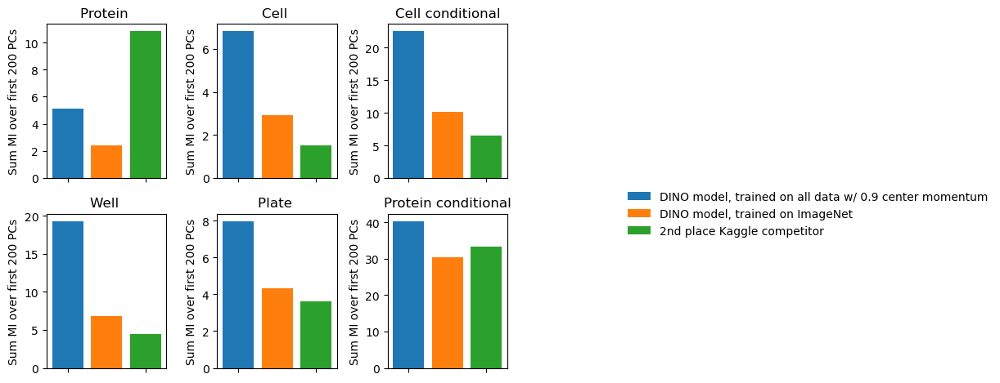

In [226]:
fig, axes = plt.subplots(2,3,facecolor='white')
num_of_methods = len(labels)
for i in range(num_of_methods):
    axes[0][0].bar(x=[i], 
            height=protein_MIs_per_method[i],
                  label=labels[i])
axes[0][0].set_xticklabels([])
axes[0][0].set_ylabel('Sum MI over first 200 PCs')
axes[0][0].set_title('Protein ')

for i in range(num_of_methods):
    axes[0][1].bar(x=[i], 
            height=cell_MIs_per_method[i],
                  label=labels[i])
axes[0][1].set_xticklabels([])
axes[0][1].set_ylabel('Sum MI over first 200 PCs')
axes[0][1].set_title('Cell ')

for i in range(num_of_methods):
    axes[1][0].bar(x=[i], 
            height=well_MIs_per_method[i],
                  label=labels[i])
axes[1][0].set_xticklabels([])
axes[1][0].set_ylabel('Sum MI over first 200 PCs')
axes[1][0].set_title('Well ')

for i in range(num_of_methods):
    axes[1][1].bar(x=[i], 
            height=plate_MIs_per_method[i],
                  label=labels[i])
axes[1][1].set_xticklabels([])
axes[1][1].set_ylabel('Sum MI over first 200 PCs')
axes[1][1].set_title('Plate ')

for i in range(num_of_methods):
    axes[0][2].bar(x=[i], 
            height=cond_cell_MIs_per_method[i],
                  label=labels[i])
axes[0][2].set_xticklabels([])
axes[0][2].set_ylabel('Sum MI over first 200 PCs')
axes[0][2].set_title('Cell conditional')

for i in range(num_of_methods):
    axes[1][2].bar(x=[i], 
            height=cond_protein_MIs_per_method[i],
                  label=labels[i])
axes[1][2].set_xticklabels([])
axes[1][2].set_ylabel('Sum MI over first 200 PCs')
axes[1][2].set_title('Protein conditional')

plt.tight_layout()

lgnd = plt.legend(loc='center right', bbox_to_anchor=(5.1, 1), frameon=False)

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=cell_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Cell MI comparison')

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=well_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Well MI comparison')

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=plate_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Plate MI comparison')


In [105]:
import matplotlib
font = {'size'   : 7}
matplotlib.rc('font', **font)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:49<00:00,  1.70s/it]


total protein MI: 16.265787054545868
total stage MI: 1.0005535178197262
total well MI: 17.975484940384653
total protein cond MI: 5.136585804923255
total stage cond MI: 6.890616911788476


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:49<00:00,  1.70s/it]


total protein MI: 10.641845910050879
total stage MI: 0.6670839958532904
total well MI: 11.212357033434516
total protein cond MI: 3.0730363106415273
total stage cond MI: 5.759180688494191


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:41<00:00,  1.61s/it]


total protein MI: 11.241772392307702
total stage MI: 0.6230662732024619
total well MI: 11.587982593296656
total protein cond MI: 3.084569958992393
total stage cond MI: 5.766778888058227


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:56<00:00,  1.16s/it]


total protein MI: 16.93477473632477
total stage MI: 1.0653224609644554
total well MI: 17.392398979688828
total protein cond MI: 4.791400052431821
total stage cond MI: 6.79886604743844


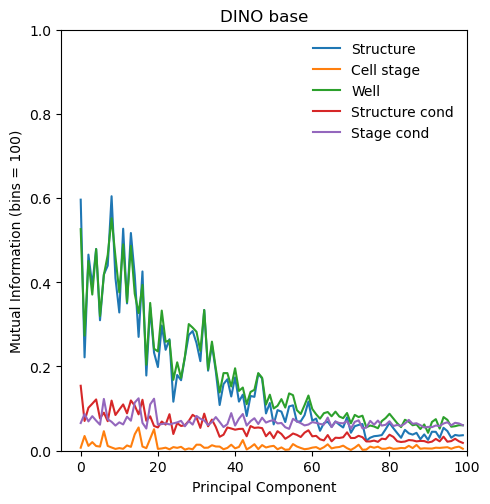

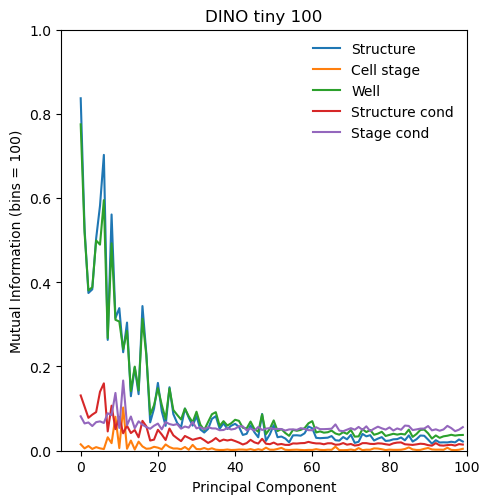

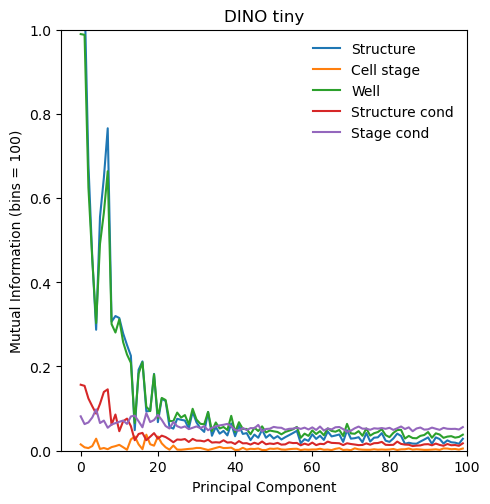

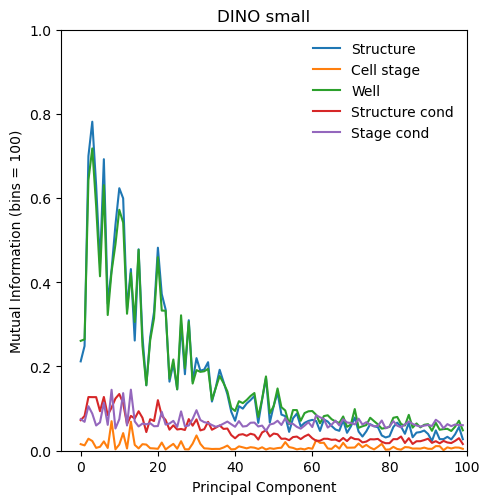

In [306]:
config_files = [
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_3_channel.yaml',
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_tiny_16_100.yaml',
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_tiny_16.yaml',
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_small_16.yaml',
               ]
labels = [
    'DINO base',
    'DINO tiny 100',
    'DINO tiny',
    'DINO small',
             ]

label_types = [
    'single_cells',
    'single_cells',
    'single_cells',
    'single_cells',
              ]

feature_types = [
    'full',
    'full',
    'full',
    'full',
              ]


results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    try:
        features, _, IDs = torch.load(config['embedding']['output_path'])            
    except:
        features, IDs = torch.load(config['embedding']['output_path'])            
    pca = decomposition.PCA(n_components=100)
    reduced_features = pca.fit_transform(features)

    well_mat, well_labels = get_col_matrix(df, ['WellId'])    
    structure_mat, structure_labels = get_col_matrix(df, ['Structure'])    
    stage_mat, stage_labels = get_col_matrix(df, ['cell_stage'])    
    protein_MIs = []
    protein_cond_MIs = []
    well_MIs = []
    stage_MIs = []
    stage_cond_MIs = []
    bins = 100
    unique_IDs = np.unique(website_df['ID'].values)
    d = dict(zip(unique_IDs, range(len(unique_IDs))))
    IDs_for_MI = np.array(list(map(lambda x:d[x], website_df['ID'].values)))
    for i in tqdm(range(reduced_features.shape[1])):
        protein_mi = mutual_info(reduced_features[:, i], 
                                      np.argmax(structure_mat, axis=1), 
                                      bins)    
        stage_mi = mutual_info(reduced_features[:, i], 
                                      np.argmax(stage_mat, axis=1), 
                                      bins)    
        well_mi = mutual_info(reduced_features[:, i], 
                                      np.argmax(well_mat, axis=1), 
                                      bins)            
        protein_MIs.append(protein_mi)
        stage_MIs.append(stage_mi)
        protein_cond_MIs.append(protein_mi_cond)
        stage_cond_MIs.append(stage_mi_cond)
        well_MIs.append(well_mi)
        
    plt.figure(figsize=(5,5), facecolor='white')
    plt.plot(protein_MIs[:200], label='Structure')
    plt.plot(stage_MIs[:200], label='Cell stage')
    plt.plot(well_MIs[:200], label='Well')
    plt.axis([-5,100,0,1])
    plt.legend(frameon=False)
    plt.xlabel('Principal Component')
    plt.ylabel(f'Mutual Information (bins = {bins})')
    plt.tight_layout()
    plt.title(label)
    
    print(f'total protein MI: {np.sum(protein_MIs)}')
    print(f'total stage MI: {np.sum(stage_MIs)}')
    print(f'total well MI: {np.sum(well_MIs)}')
    

In [287]:
# Whole image models
# protein_MIs_per_method = [10.984846226425152,11.570335005641862,7.575007896007305,15.368080321930996]
# cell_MIs_per_method = [16.156413610918662,15.228737382244677,13.21345991956876,8.768203434231438]
# well_MIs_per_method = [26.95645108433178,26.271532358949806,26.764164793495326,19.920514349392704]
# plate_MIs_per_method = [20.66017992834786,20.735059127557594,20.34029131979417,17.806900309343007]

# Single cell models
# protein_MIs_per_method = [5.130469643581576,2.4044629642780175,10.82468483082295]
# cell_MIs_per_method = [6.815486502369792,2.912101103757867,1.5119608838081895]
# well_MIs_per_method = [19.305702513639158,6.866070205924242,4.405274219336405]
# cond_protein_MIs_per_method = [40.33359052428734,30.41566437438975,33.3243771872726]
# cond_cell_MIs_per_method = [22.479207557497876,10.189144831742283,6.549019441546576]

# Allen models
protein_MIs_per_method = [4.335566633759867, 5.04786534383719,6.189449678416019,5.021066770178232]
stage_MIs_per_method = [0.16440831807657244,0.18484456282215012,0.10281199619061057,0.1980807876198634]
well_MIs_per_method = [4.313288888458869,4.715190418233377,5.659302530176896,4.7479368708560505]
cond_protein_MIs_per_method = [1.0012728513433542,0.9951707561173441,1.1721534062450696,1.068633589726787]
cond_stage_MIs_per_method = [0.7633651015994406, 0.7860647431656336, 0.7088631558688805,0.8371584695705192]
cond_stage_ratio_per_method = np.array(cond_stage_MIs_per_method) / np.array(stage_MIs_per_method)
cond_protein_ratio_per_method = np.array(cond_protein_MIs_per_method) / np.array(protein_MIs_per_method)


4.643105108854083

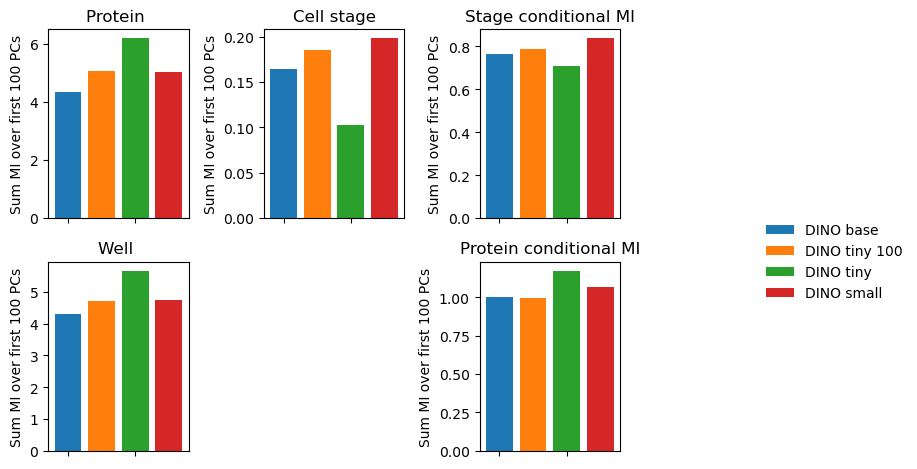

In [305]:
fig, axes = plt.subplots(2,3,facecolor='white')
num_of_methods = len(labels)
for i in range(num_of_methods):
    axes[0][0].bar(x=[i], 
            height=protein_MIs_per_method[i],
                  label=labels[i])
axes[0][0].set_xticklabels([])
axes[0][0].set_ylabel('Sum MI over first 100 PCs')
axes[0][0].set_title('Protein ')

for i in range(num_of_methods):
    axes[0][1].bar(x=[i], 
            height=stage_MIs_per_method[i],
                  label=labels[i])
axes[0][1].set_xticklabels([])
axes[0][1].set_ylabel('Sum MI over first 100 PCs')
axes[0][1].set_title('Cell stage')

for i in range(num_of_methods):
    axes[1][0].bar(x=[i], 
            height=well_MIs_per_method[i],
                  label=labels[i])
axes[1][0].set_xticklabels([])
axes[1][0].set_ylabel('Sum MI over first 100 PCs')
axes[1][0].set_title('Well ')

axes[1][1].axis('off')

for i in range(num_of_methods):
    axes[0][2].bar(x=[i], 
            height=cond_stage_MIs_per_method[i],
                  label=labels[i])
axes[0][2].set_xticklabels([])
axes[0][2].set_ylabel('Sum MI over first 100 PCs')
axes[0][2].set_title('Stage conditional MI')

for i in range(num_of_methods):
    axes[1][2].bar(x=[i], 
            height=cond_protein_MIs_per_method[i],
                  label=labels[i])
axes[1][2].set_xticklabels([])
axes[1][2].set_ylabel('Sum MI over first 100 PCs')
axes[1][2].set_title('Protein conditional MI')

plt.tight_layout()

lgnd = plt.legend(loc='center right', bbox_to_anchor=(3.1, 1), frameon=False)

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=cell_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Cell MI comparison')

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=well_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Well MI comparison')

# plt.figure(facecolor='white')
# plt.bar(x=range(4), 
#         height=plate_MIs_per_method)
# plt.xticks(range(4), labels, rotation=45)
# plt.ylabel('Sum MI over first 200 PCs')
# plt.title('Plate MI comparison')


In [394]:
config_files = [
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_3_channel.yaml',
               ]
labels = [
    'DINO base',
             ]

label_types = [
    'single_cells',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
try:
    features, _, IDs = torch.load(config['embedding']['output_path'])            
except:
    features, IDs = torch.load(config['embedding']['output_path'])            

allen_structure_MI = []
allen_stage_MI = []
allen_well_MI = []
num_bins = 100
for i in tqdm(range(features.shape[1])):
    structure_mi = mutual_info(features[:, i].numpy(), 
                np.argmax(structure_mat, axis=1),
                num_bins
                )
    allen_structure_MI.append(structure_mi)
    stage_mi = mutual_info(features[:, i].numpy(), 
                np.argmax(stage_mat, axis=1),
                num_bins
                )
    allen_stage_MI.append(stage_mi)    
    well_mi = mutual_info(features[:, i].numpy(), 
                np.argmax(well_mat, axis=1),
                num_bins
                )
    allen_well_MI.append(well_mi)        

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [02:40<00:00,  4.78it/s]


In [396]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
               ]
labels = [
    'DINO model, trained on all data w/ 0.9 center momentum',
             ]

label_types = [
    'single_cells',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)
        
one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
website_indices = np.where(df.ID.str.contains('_'))[0]
website_df = df.iloc[website_indices].reset_index()
website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
website_proteins = protein_localizations[website_indices]
cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
website_cell = cell_mat[website_indices]
one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]

single_HPA_protein_MI = []
single_HPA_cell_MI = []
single_HPA_well_MI = []
for i in tqdm(range(website_features.shape[1])):
    protein_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                100
                )
    single_HPA_protein_MI.append(protein_mi)
    
    cell_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_cell[one_protein_indices], axis=1),
                100
                )
    single_HPA_cell_MI.append(cell_mi)    
    
    well_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                website_df['well'].values[one_protein_indices].astype(int),
                100
                )
    single_HPA_well_MI.append(well_mi)        

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [01:42<00:00,  7.52it/s]


In [543]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
               ]
labels = [
    'DINO model, whole image',
             ]

label_types = [
    'whole_image',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)

one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
website_indices = np.where(df.ID.str.contains('_'))[0]
website_features = features[website_indices,:]
website_df = df.iloc[website_indices].reset_index()
website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
website_proteins = protein_localizations[website_indices]
cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
website_cell = cell_mat[website_indices]
one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]

whole_HPA_protein_MI = []
whole_HPA_cell_MI = []
whole_HPA_well_MI = []
for i in tqdm(range(website_features.shape[1])):
    protein_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                100
                )
    whole_HPA_protein_MI.append(protein_mi)
    
    cell_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_cell[one_protein_indices], axis=1),
                100
                )
    whole_HPA_cell_MI.append(cell_mi)    
    
    well_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                website_df['well'].values[one_protein_indices].astype(int),
                100
                )
    whole_HPA_well_MI.append(well_mi)        

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [00:26<00:00, 28.86it/s]


In [544]:
def get_embeddings(features_to_fit, features_to_transform, labels=None):
    scaled_features_to_fit = features_to_fit
    scaled_features_to_transform = features_to_transform
    umap_unique = cuml.UMAP(init='spectral', metric='euclidean', min_dist=0.1, n_neighbors=15, n_components=2, spread=4, output_type="numpy", verbose=False, n_epochs=2600, transform_queue_size=20, random_state=42)
    umap_unique = umap_unique.fit(scaled_features_to_fit.numpy(), y=labels)
    transformed_features = umap_unique.transform(scaled_features_to_transform.numpy())
    return umap_unique, 0, 0, transformed_features, scaled_features_to_transform

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


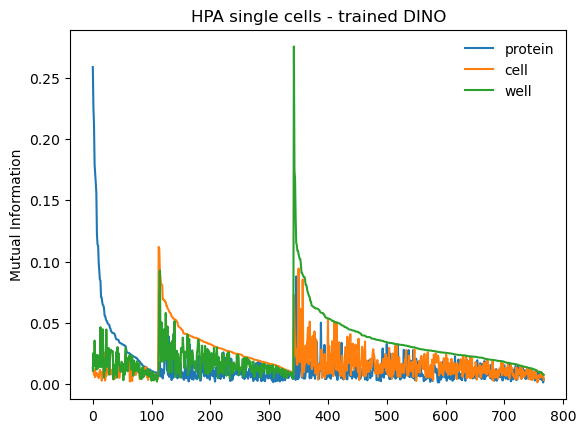

In [549]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',
               ]
labels = [
    'DINO model, trained on all data w/ 0.9 center momentum',
             ]

label_types = [
    'single_cells',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)

single_HPA_protein_MI = np.array(single_HPA_protein_MI)
single_HPA_cell_MI = np.array(single_HPA_cell_MI)
single_HPA_well_MI = np.array(single_HPA_well_MI)
high_protein = np.where((single_HPA_protein_MI > single_HPA_cell_MI) & (single_HPA_protein_MI > single_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(single_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((single_HPA_cell_MI > single_HPA_protein_MI) & (single_HPA_cell_MI > single_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(single_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((single_HPA_well_MI > single_HPA_protein_MI) & (single_HPA_well_MI > single_HPA_cell_MI))[0]
high_well = high_well[np.argsort(single_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.figure(facecolor='white')
plt.plot(single_HPA_protein_MI[new_indices], label='protein')
plt.plot(single_HPA_cell_MI[new_indices], label='cell')
plt.plot(single_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA single cells - trained DINO')

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  


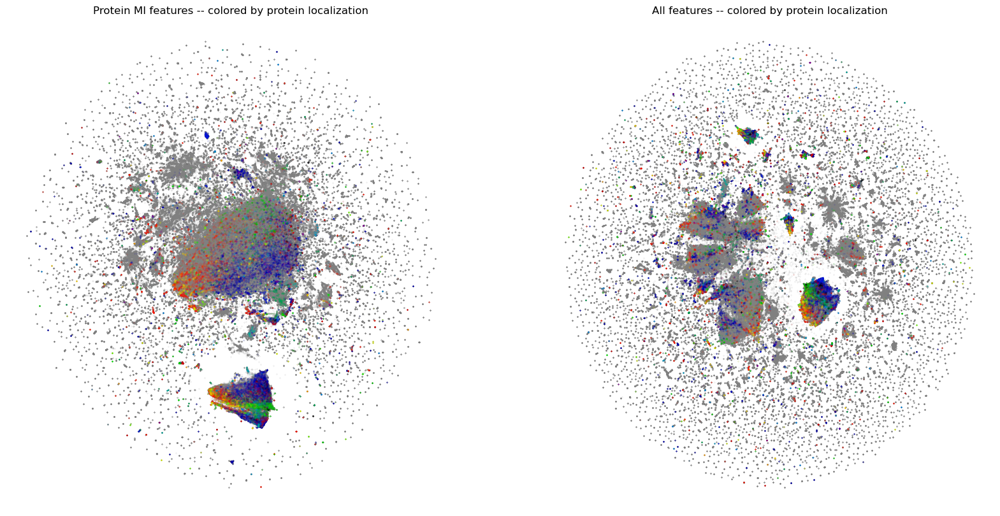

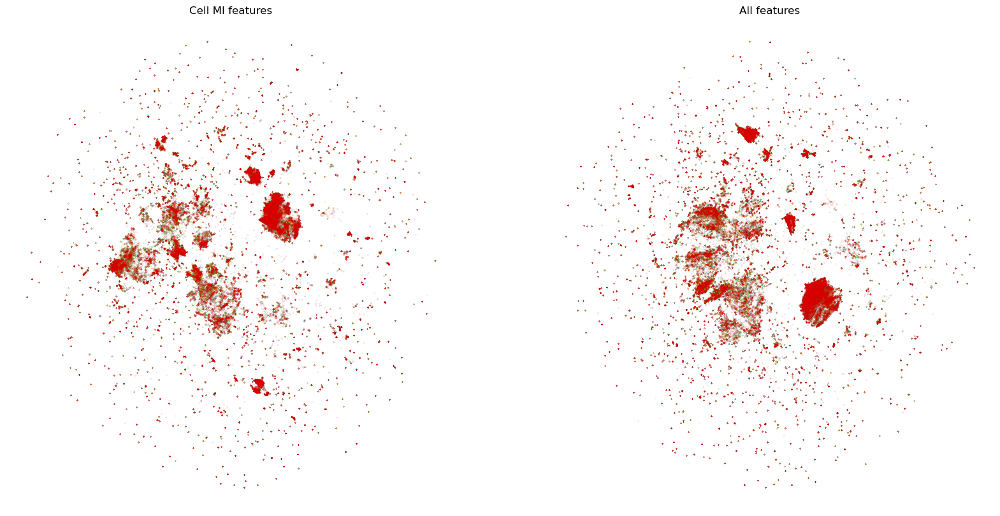

In [552]:
cmap = cm.nipy_spectral

fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
axes[0].scatter(protein_embedding[:,0],
            protein_embedding[:,1],
            s=0.01,
                color='grey')
axes[1].scatter(all_features_embedding[:,0],
            all_features_embedding[:,1],
            s=0.01,
                color='grey')

for ind, protein_ind in enumerate(np.argsort(protein_localizations[one_protein_indices].sum(axis=0)).numpy()[::-1]):
    protein_indices = np.where(np.argmax(protein_localizations[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[one_protein_indices][protein_indices,0],
                protein_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[0].axis('off')
    axes[0].set_title('Protein MI features -- colored by protein localization')
    axes[1].scatter(all_features_embedding[one_protein_indices][protein_indices,0],
                all_features_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[1].set_title('All features -- colored by protein localization')    
    axes[1].axis('off')
    
fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
for protein_ind in np.unique(np.argmax(cell_mat, axis=1)):
    protein_indices = np.where(np.argmax(cell_mat, axis=1) == protein_ind)[0]
    axes[0].scatter(cell_embedding[protein_indices,0],
                cell_embedding[protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))                
    axes[0].set_title('Cell MI features')
    axes[0].axis('off')
    
    axes[1].scatter(all_features_embedding[protein_indices,0],
                    all_features_embedding[protein_indices,1],
                    s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))
    axes[1].set_title('All features')    
    axes[1].axis('off')

    

In [ ]:

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  


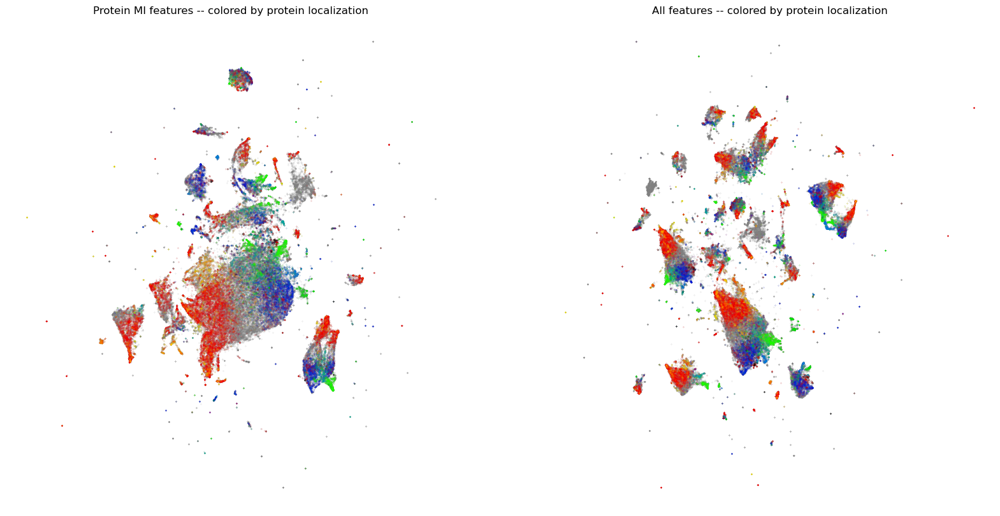

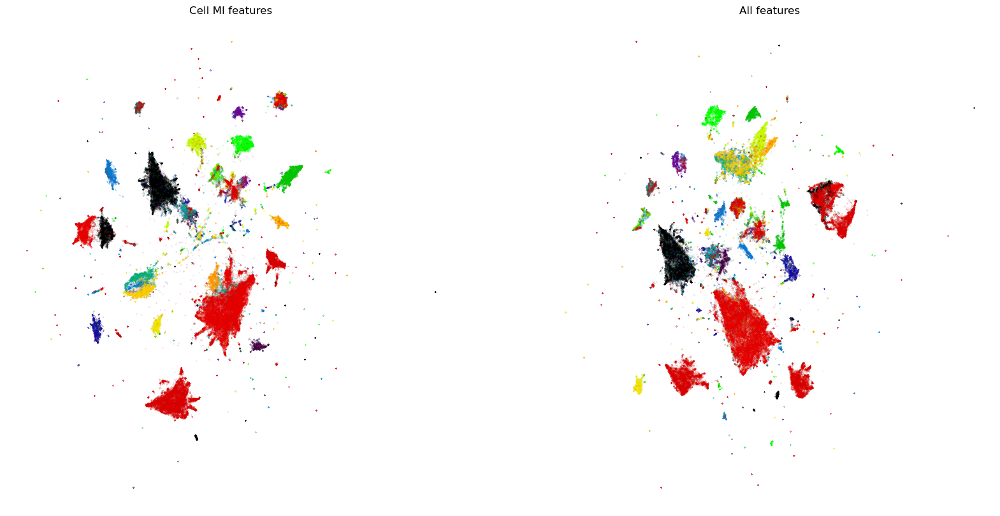

In [546]:
cmap = cm.nipy_spectral

fig, axes = plt.subplots(1,2,figsize=(20,10))
axes[0].scatter(protein_embedding[:,0],
            protein_embedding[:,1],
            s=0.01,
                color='grey')
axes[1].scatter(all_features_embedding[:,0],
            all_features_embedding[:,1],
            s=0.01,
                color='grey')

for ind, protein_ind in enumerate(np.argsort(protein_localizations[one_protein_indices].sum(axis=0)).numpy()[::-1]):
    protein_indices = np.where(np.argmax(protein_localizations[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[one_protein_indices][protein_indices,0],
                protein_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[0].axis('off')
    axes[0].set_title('Protein MI features -- colored by protein localization')
    axes[1].scatter(all_features_embedding[one_protein_indices][protein_indices,0],
                all_features_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[1].set_title('All features -- colored by protein localization')    
    axes[1].axis('off')
    
fig, axes = plt.subplots(1,2,figsize=(20,10))
for protein_ind in np.unique(np.argmax(cell_mat, axis=1)):
    protein_indices = np.where(np.argmax(cell_mat, axis=1) == protein_ind)[0]
    axes[0].scatter(cell_embedding[protein_indices,0],
                cell_embedding[protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))                
    axes[0].set_title('Cell MI features')
    axes[0].axis('off')
    
    axes[1].scatter(all_features_embedding[protein_indices,0],
                    all_features_embedding[protein_indices,1],
                    s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))
    axes[1].set_title('All features')    
    axes[1].axis('off')

    

Text(0.5, 1.0, 'HPA whole cells - trained DINO')

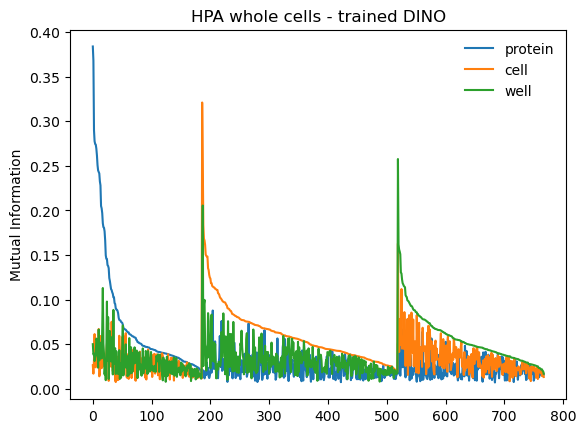

In [548]:
whole_HPA_protein_MI = np.array(whole_HPA_protein_MI)
whole_HPA_cell_MI = np.array(whole_HPA_cell_MI)
whole_HPA_well_MI = np.array(whole_HPA_well_MI)
high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
plt.plot(whole_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA whole cells - trained DINO')

Text(0.5, 1.0, 'HPA single cells - trained DINO')

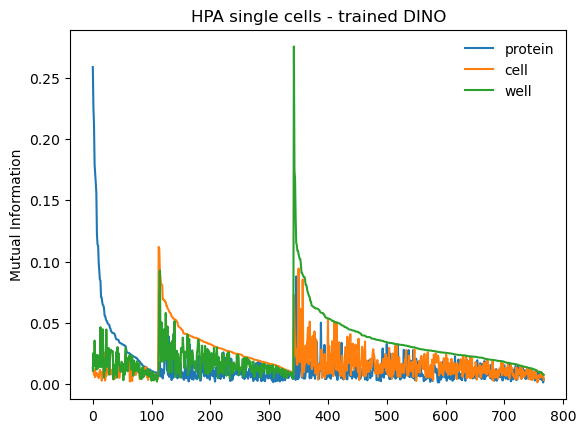

In [547]:
single_HPA_protein_MI = np.array(single_HPA_protein_MI)
single_HPA_cell_MI = np.array(single_HPA_cell_MI)
single_HPA_well_MI = np.array(single_HPA_well_MI)
high_protein = np.where((single_HPA_protein_MI > single_HPA_cell_MI) & (single_HPA_protein_MI > single_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(single_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((single_HPA_cell_MI > single_HPA_protein_MI) & (single_HPA_cell_MI > single_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(single_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((single_HPA_well_MI > single_HPA_protein_MI) & (single_HPA_well_MI > single_HPA_cell_MI))[0]
high_well = high_well[np.argsort(single_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(single_HPA_protein_MI[new_indices], label='protein')
plt.plot(single_HPA_cell_MI[new_indices], label='cell')
plt.plot(single_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA single cells - trained DINO')

In [430]:
def get_embeddings(features_to_fit, features_to_transform, labels=None):
    scaled_features_to_fit = features_to_fit
    scaled_features_to_transform = features_to_transform
    umap_unique = cuml.UMAP(init='spectral', metric='euclidean', min_dist=0.1, n_neighbors=15, n_components=2, spread=4, output_type="numpy", verbose=False, n_epochs=2600, transform_queue_size=20, random_state=42)
    umap_unique = umap_unique.fit(scaled_features_to_fit.numpy(), y=labels)
    transformed_features = umap_unique.transform(scaled_features_to_transform.numpy())
    return umap_unique, 0, 0, transformed_features, scaled_features_to_transform

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices][:,sorted(high_protein)]), torch.Tensor(website_features[one_protein_indices][:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices][:,sorted(high_cell)]), torch.Tensor(website_features[one_protein_indices][:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices]), torch.Tensor(website_features[one_protein_indices]))  

fig, axes = plt.subplots(1,2)
for protein_ind in np.unique(np.argmax(website_proteins[one_protein_indices], axis=1).numpy()):
    protein_indices = np.where(np.argmax(website_proteins[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[0].set_title('Protein MI features')
    axes[1].scatter(all_features_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[1].set_title('All features')    
    
plt.figure()
for protein_ind in np.unique(np.argmax(website_cell[one_protein_indices], axis=1).numpy()):
    protein_indices = np.where(np.argmax(website_cell[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(cell_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[0].set_title('Cell MI features')
    axes[1].scatter(all_features_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[1].set_title('All features')    

(268752,)

In [436]:
def get_embeddings(features_to_fit, features_to_transform, labels=None):
    scaled_features_to_fit = features_to_fit
    scaled_features_to_transform = features_to_transform
    umap_unique = cuml.UMAP(init='spectral', metric='euclidean', min_dist=0.1, n_neighbors=15, n_components=2, spread=4, output_type="numpy", verbose=False, n_epochs=2600, transform_queue_size=20, random_state=42)
    umap_unique = umap_unique.fit(scaled_features_to_fit.numpy(), y=labels)
    transformed_features = umap_unique.transform(scaled_features_to_transform.numpy())
    return umap_unique, 0, 0, transformed_features, scaled_features_to_transform

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices][:,sorted(high_protein)]), torch.Tensor(website_features[one_protein_indices][:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices][:,sorted(high_cell)]), torch.Tensor(website_features[one_protein_indices][:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(website_features[one_protein_indices]), torch.Tensor(website_features[one_protein_indices]))  

fig, axes = plt.subplots(1,2)
for protein_ind in np.unique(np.argmax(website_proteins[one_protein_indices], axis=1).numpy()):
    protein_indices = np.where(np.argmax(website_proteins[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[0].set_title('Protein MI features')
    axes[1].scatter(all_features_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[1].set_title('All features')    
    
plt.figure()
for protein_ind in np.unique(np.argmax(website_cell[one_protein_indices], axis=1).numpy()):
    protein_indices = np.where(np.argmax(website_cell[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(cell_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[0].set_title('Cell MI features')
    axes[1].scatter(all_features_embedding[protein_indices,0],
                protein_embedding[protein_indices,1],
                s=0.01)
    axes[1].set_title('All features')    

/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


KeyboardInterrupt: 

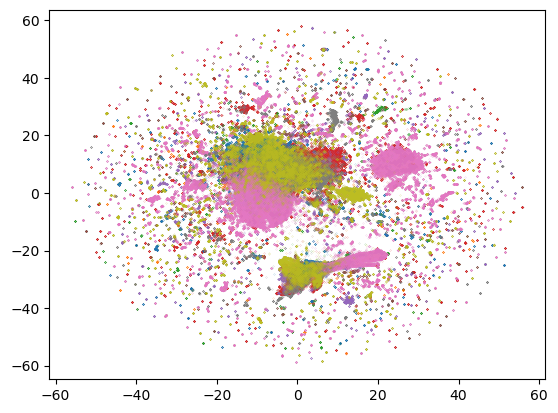

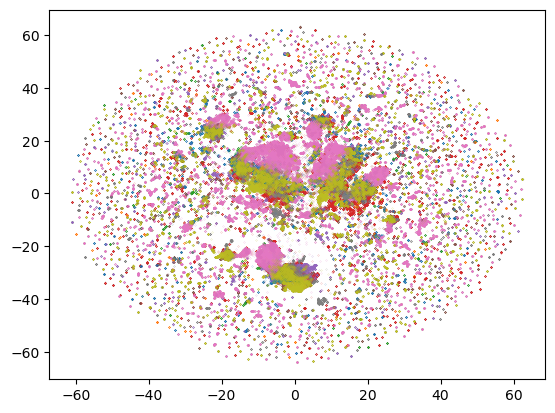

tensor([[-0.3677, -0.7403,  0.3463,  ..., -0.4569,  2.4695,  0.9978],
        [-0.2615,  0.6671,  0.7068,  ..., -0.2764,  2.8783, -0.0508],
        [-0.3127, -0.7752,  0.2699,  ..., -0.6423,  1.5730, -0.0386],
        ...,
        [-0.6985, -0.1586,  0.4315,  ..., -1.0979, -0.8968,  2.7432],
        [-0.7321, -0.4858,  0.6123,  ..., -0.7866, -4.5278,  1.6917],
        [-0.7713, -1.3630,  0.5807,  ...,  0.0343, -1.0375,  2.0453]])

Text(0.5, 1.0, 'Allen - trained DINO')

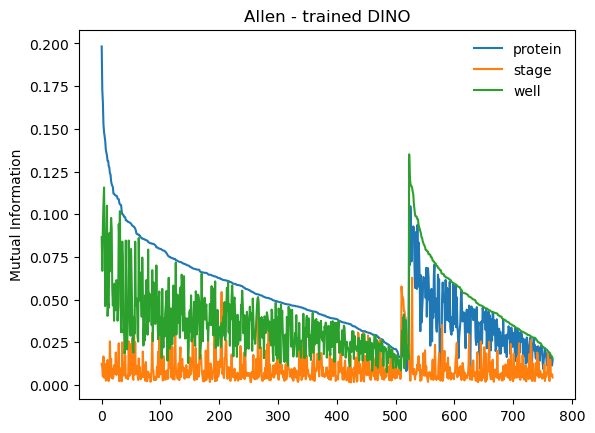

In [397]:
allen_structure_MI = np.array(allen_structure_MI)
allen_stage_MI = np.array(allen_stage_MI)
allen_well_MI = np.array(allen_well_MI)

high_protein = np.where((allen_structure_MI > allen_stage_MI) & (allen_structure_MI > allen_well_MI))[0]
high_protein = high_protein[np.argsort(allen_structure_MI[high_protein])][::-1]

high_stage = np.where((allen_stage_MI > allen_structure_MI) & (allen_stage_MI > allen_well_MI))[0]
high_stage = high_stage[np.argsort(allen_stage_MI[high_stage])][::-1]

high_well = np.where((allen_well_MI > allen_structure_MI) & (allen_well_MI > allen_stage_MI))[0]
high_well = high_well[np.argsort(allen_well_MI[high_well])][::-1]

new_indices = np.concatenate((high_protein, high_stage, high_well))
plt.plot(allen_structure_MI[new_indices], label='protein')
plt.plot(allen_stage_MI[new_indices], label='stage')
plt.plot(allen_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('Allen - trained DINO')

In [553]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
    'Pretrained DINO model, whole image',
             ]

label_types = [
    'whole_image',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)

one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
website_indices = np.where(df.ID.str.contains('_'))[0]
website_features = features[website_indices,:]
website_df = df.iloc[website_indices].reset_index()
website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
website_proteins = protein_localizations[website_indices]
cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
website_cell = cell_mat[website_indices]
one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]

whole_HPA_protein_MI = []
whole_HPA_cell_MI = []
whole_HPA_well_MI = []
for i in tqdm(range(website_features.shape[1])):
    protein_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                100
                )
    whole_HPA_protein_MI.append(protein_mi)
    
    cell_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                np.argmax(website_cell[one_protein_indices], axis=1),
                100
                )
    whole_HPA_cell_MI.append(cell_mi)    
    
    well_mi = mutual_info(website_features[one_protein_indices, i].numpy(), 
                website_df['well'].values[one_protein_indices].astype(int),
                100
                )
    whole_HPA_well_MI.append(well_mi)        

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [04:11<00:00, 12.21it/s]


/scr/mdoron/miniconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:501: RuntimeWarning: divide by zero encountered in power
  return func(xdata, *params) - ydata


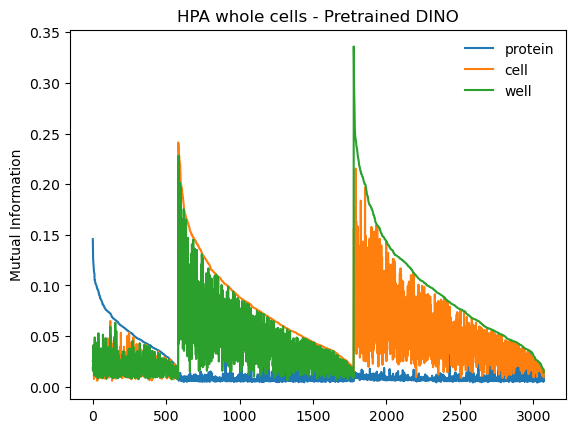

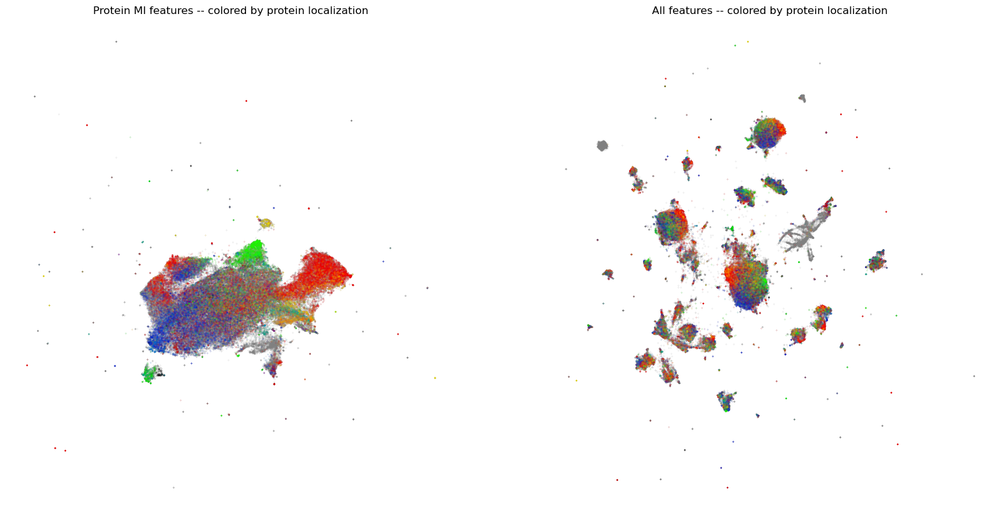

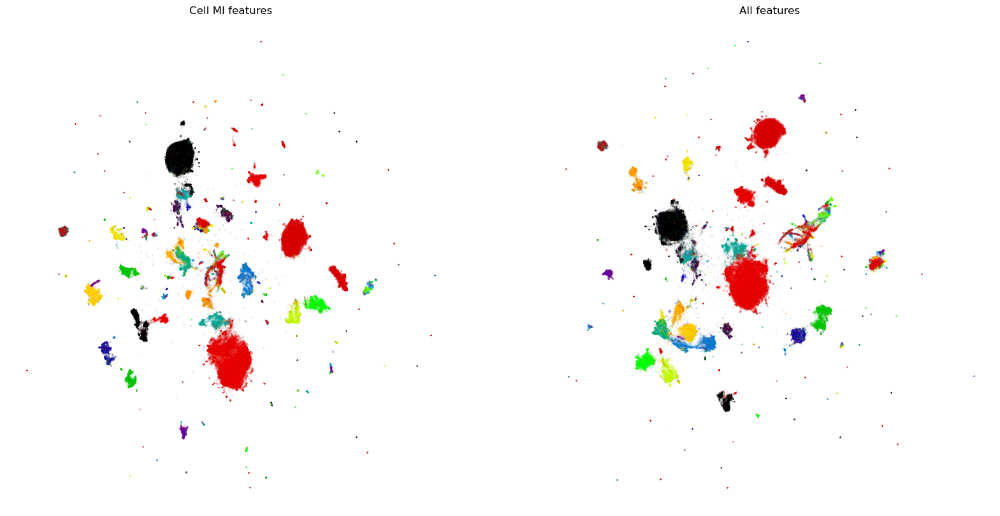

In [554]:
whole_HPA_protein_MI = np.array(whole_HPA_protein_MI)
whole_HPA_cell_MI = np.array(whole_HPA_cell_MI)
whole_HPA_well_MI = np.array(whole_HPA_well_MI)
high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
plt.plot(whole_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA whole cells - Pretrained DINO')

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  


cmap = cm.nipy_spectral

fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
axes[0].scatter(protein_embedding[:,0],
            protein_embedding[:,1],
            s=0.01,
                color='grey')
axes[1].scatter(all_features_embedding[:,0],
            all_features_embedding[:,1],
            s=0.01,
                color='grey')

for ind, protein_ind in enumerate(np.argsort(protein_localizations[one_protein_indices].sum(axis=0)).numpy()[::-1]):
    protein_indices = np.where(np.argmax(protein_localizations[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[one_protein_indices][protein_indices,0],
                protein_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[0].axis('off')
    axes[0].set_title('Protein MI features -- colored by protein localization')
    axes[1].scatter(all_features_embedding[one_protein_indices][protein_indices,0],
                all_features_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[1].set_title('All features -- colored by protein localization')    
    axes[1].axis('off')
    
fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
for protein_ind in np.unique(np.argmax(cell_mat, axis=1)):
    protein_indices = np.where(np.argmax(cell_mat, axis=1) == protein_ind)[0]
    axes[0].scatter(cell_embedding[protein_indices,0],
                cell_embedding[protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))                
    axes[0].set_title('Cell MI features')
    axes[0].axis('off')
    
    axes[1].scatter(all_features_embedding[protein_indices,0],
                    all_features_embedding[protein_indices,1],
                    s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))
    axes[1].set_title('All features')    
    axes[1].axis('off')

    

In [555]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
               ]
labels = [
    'Bestfitting model, whole image',
             ]

label_types = [
    'whole_image',
              ]

feature_types = [
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)

one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
website_indices = np.where(df.ID.str.contains('_'))[0]
website_features = features[website_indices,:]
website_df = df.iloc[website_indices].reset_index()
website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
website_proteins = protein_localizations[website_indices]
cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
website_cell = cell_mat[website_indices]
one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]

factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                np.argmax(website_cell[one_protein_indices], axis=1),
                website_df['well'].values[one_protein_indices].astype(int))).T
codes = website_features[one_protein_indices]
dcimig_score, mi_matrix = dcimig(factors, codes)
highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]

whole_HPA_protein_MI = mi_matrix[0,:]
whole_HPA_cell_MI = mi_matrix[1,:]
whole_HPA_well_MI = mi_matrix[2,:]
high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
plt.plot(whole_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title(label)

umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  

cmap = cm.nipy_spectral

fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
axes[0].scatter(protein_embedding[:,0],
            protein_embedding[:,1],
            s=0.01,
                color='grey')
axes[1].scatter(all_features_embedding[:,0],
            all_features_embedding[:,1],
            s=0.01,
                color='grey')

for ind, protein_ind in enumerate(np.argsort(protein_localizations[one_protein_indices].sum(axis=0)).numpy()[::-1]):
    protein_indices = np.where(np.argmax(protein_localizations[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[one_protein_indices][protein_indices,0],
                protein_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[0].axis('off')
    axes[0].set_title(f'{label} - Protein MI features -- colored by protein localization')
    axes[1].scatter(all_features_embedding[one_protein_indices][protein_indices,0],
                all_features_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[1].set_title(f'{label} - All features -- colored by protein localization')    
    axes[1].axis('off')
    

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [01:19<00:00, 12.90it/s]


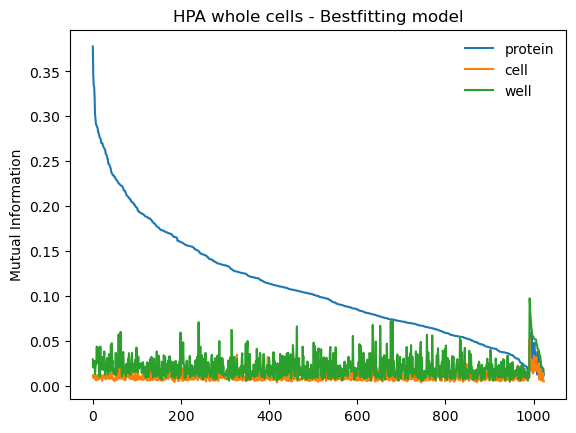

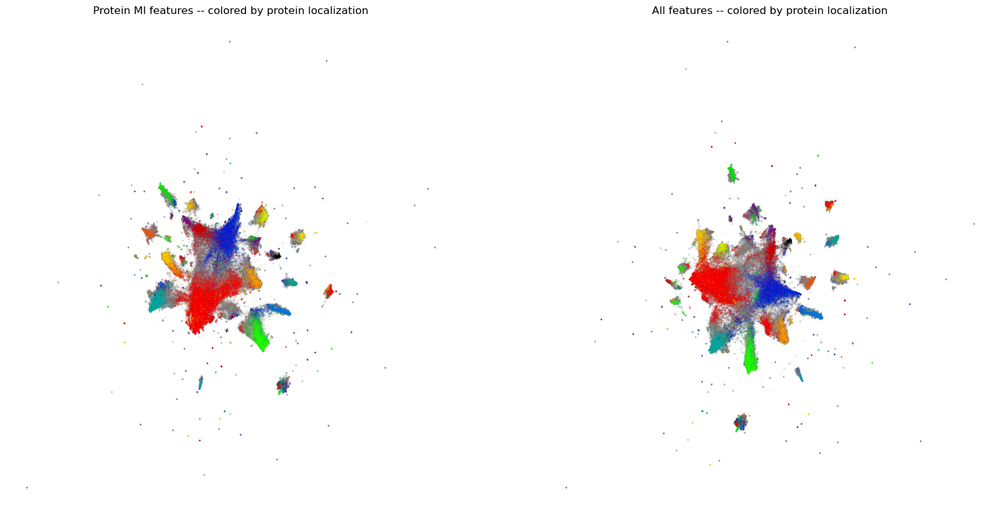

In [557]:
factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                np.argmax(website_cell[one_protein_indices], axis=1),
                website_df['well'].values[one_protein_indices].astype(int))).T
codes = website_features[one_protein_indices]
dcimig_score, mi_matrix = dcimig(factors, codes)
highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]

whole_HPA_protein_MI = mi_matrix[0,:]
whole_HPA_cell_MI = mi_matrix[1,:]
whole_HPA_well_MI = mi_matrix[2,:]
high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
plt.plot(whole_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA whole cells - Bestfitting model')


umap_reducer, features_mean, features_std, protein_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_protein)]), torch.Tensor(features[:,sorted(high_protein)]))  
umap_reducer, features_mean, features_std, cell_embedding, scaled_features = get_embeddings(torch.Tensor(features[:,sorted(high_cell)]), torch.Tensor(features[:,sorted(high_cell)]))  
umap_reducer, features_mean, features_std, all_features_embedding, scaled_features = get_embeddings(torch.Tensor(features), torch.Tensor(features))  


cmap = cm.nipy_spectral

fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
axes[0].scatter(protein_embedding[:,0],
            protein_embedding[:,1],
            s=0.01,
                color='grey')
axes[1].scatter(all_features_embedding[:,0],
            all_features_embedding[:,1],
            s=0.01,
                color='grey')

for ind, protein_ind in enumerate(np.argsort(protein_localizations[one_protein_indices].sum(axis=0)).numpy()[::-1]):
    protein_indices = np.where(np.argmax(protein_localizations[one_protein_indices], axis=1).numpy() == protein_ind)[0]
    axes[0].scatter(protein_embedding[one_protein_indices][protein_indices,0],
                protein_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[0].axis('off')
    axes[0].set_title('Protein MI features -- colored by protein localization')
    axes[1].scatter(all_features_embedding[one_protein_indices][protein_indices,0],
                all_features_embedding[one_protein_indices][protein_indices,1],
                s=0.01,
                    color=cmap(protein_ind / len(np.unique(np.argmax(protein_localizations[one_protein_indices], axis=1)))))
    axes[1].set_title('All features -- colored by protein localization')    
    axes[1].axis('off')
    
# fig, axes = plt.subplots(1,2,figsize=(20,10), facecolor='white')
# for protein_ind in np.unique(np.argmax(cell_mat, axis=1)):
#     protein_indices = np.where(np.argmax(cell_mat, axis=1) == protein_ind)[0]
#     axes[0].scatter(cell_embedding[protein_indices,0],
#                 cell_embedding[protein_indices,1],
#                 s=0.01,
#                     color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))                
#     axes[0].set_title('Cell MI features')
#     axes[0].axis('off')
    
#     axes[1].scatter(all_features_embedding[protein_indices,0],
#                     all_features_embedding[protein_indices,1],
#                     s=0.01,
#                     color=cmap(protein_ind / len(np.unique(np.argmax(cell_mat, axis=1)))))
#     axes[1].set_title('All features')    
#     axes[1].axis('off')

    

In [835]:
factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                np.argmax(website_cell[one_protein_indices], axis=1),
                website_df['well'].values[one_protein_indices].astype(int))).T
codes = website_features[one_protein_indices]
dcimig_score, mi_matrix = dcimig(factors, codes)
highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]

whole_HPA_protein_MI = mi_matrix[0,:]
whole_HPA_cell_MI = mi_matrix[1,:]
whole_HPA_well_MI = mi_matrix[2,:]
high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
new_indices = np.concatenate((high_protein, high_cell, high_well))
plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
plt.plot(whole_HPA_well_MI[new_indices], label='well')
plt.legend(frameon=False)
plt.ylabel('Mutual Information')
plt.title('HPA whole cells - Bestfitting model')


[0.5021738514836114, 0, 0.07191445095143467]

In [567]:
from disentanglement.src.utils import get_bin_index, get_mutual_information
from pyitlib import discrete_random_variable as drv
from sklearn.preprocessing import minmax_scale


In [644]:

def dcimig(factors, codes, continuous_factors=True, nb_factor_bins=5, nb_code_bins=100):
    ''' DCIMIG metric from A. Sepliarskaia, J. Kiseleva, and M. de Rijke,
        “Evaluating disentangled representations,”
        arXiv:1910.05587, 2020.
    
    :param factors:                         dataset of factors
                                            each column is a factor and each line is a data point
    :param codes:                           latent codes associated to the dataset of factors
                                            each column is a latent code and each line is a data point
    :param continuous_factors:              True:   factors are described as continuous variables
                                            False:  factors are described as discrete variables
    :param nb_bins:                         number of bins to use for discretization
    '''
    # count the number of factors and latent codes
    nb_factors = factors.shape[1]
    nb_codes = codes.shape[1]
    
    # quantize factors if they are continuous
    if continuous_factors:
        factors = minmax_scale(factors)  # normalize in [0, 1] all columns
        factors = get_bin_index(factors, nb_factor_bins)  # quantize values and get indexes
    
    # quantize latent codes
    codes = minmax_scale(codes)  # normalize in [0, 1] all columns
    codes = get_bin_index(codes, nb_code_bins)  # quantize values and get indexes
    
    # compute mutual information matrix
    mi_matrix = np.zeros((nb_factors, nb_codes))
    for f in tqdm(range(nb_factors)):
        for c in range(nb_codes):
            mi_matrix[f, c] = get_mutual_information(factors[:, f], codes[:, c], normalize=False)

    # compute the gap for all codes
    normalized_mi_matrix = np.copy(mi_matrix)
    for c in range(nb_codes):
        mi_c = np.sort(normalized_mi_matrix[:, c])
        max_idx = np.argmax(normalized_mi_matrix[:, c])

        # get diff between highest and second highest term gap
        gap = mi_c[-1] - mi_c[-2]

        # replace the best by the gap and the rest by 0
        normalized_mi_matrix[:, c] = normalized_mi_matrix[:, c] * 0
        normalized_mi_matrix[max_idx, c] = gap

    # find the best gap for each factor
    gap_sum = 0
    for f in range(nb_factors):
        gap_sum += np.max(normalized_mi_matrix[f, :])

    # sum the entropy for each factors
    factor_entropy = 0
    for f in range(nb_factors):
        factor_entropy += drv.entropy(factors[:, f])

    # compute the mean gap
    dcimig_score = gap_sum / factor_entropy
    
    return dcimig_score, mi_matrix


In [908]:
config = yaml.safe_load(open(config_file, "r"))
df = pd.read_csv(config['embedding']['df_path'])
features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
try:
    protein_localizations = torch.stack(protein_localizations)
except:
    pass
protein_localizations = torch.Tensor(protein_localizations)

one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
website_indices = np.where(df.ID.str.contains('_'))[0]
website_features = features[website_indices,:]
website_df = df.iloc[website_indices].reset_index()
website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
website_proteins = protein_localizations[website_indices]
cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
website_cell = cell_mat[website_indices]
one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
website_features -= website_features.min(axis=0)[0]
website_features /= website_features.max(axis=0)[0]

factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                np.argmax(website_cell[one_protein_indices], axis=1),
                website_df['well'].values[one_protein_indices].astype(int))).T
codes = website_features[one_protein_indices]

whole_HPA_protein_MI = []
whole_HPA_cell_MI = []
whole_HPA_well_MI = []

for i in tqdm(range(website_features.shape[1])):
    protein_mi = mutual_info(codes[:,0].numpy(), factors[:,0], code_bin, factor_bin)
    whole_HPA_protein_MI.append(protein_mi)
    cell_mi = mutual_info(codes[:,1].numpy(), factors[:,1], code_bin, factor_bin)
    whole_HPA_cell_MI.append(cell_mi)    
    well_mi = mutual_info(codes[:,2].numpy(), factors[:,2], code_bin, factor_bin)
    whole_HPA_well_MI.append(well_mi)      
mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
#     dcimig_score, mi_matrix = dcimig(factors, codes)
highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
factor_gaps_per_method.append(factor_gaps)
mi_matrices.append(mi_matrix)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [00:34<00:00, 22.40it/s]


In [911]:
codes.shape

torch.Size([46269, 768])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [00:17<00:00, 57.75it/s]


[[0.0, 99.63406690873643, 90.25314485297974], [0.0, 0.0, 0.0], [0.5359875838226228, 0.852408769040501, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [00:14<00:00, 54.60it/s]


[[0.0, 8.78256910519798, 8.471405265021943], [12.805878221405866, 0.0, 9.692132624720646], [8.40828700776772, 5.546243266402641, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [00:58<00:00, 52.78it/s]


[[0.0, 19.6997081182773, 20.239416723280957], [84.36329961859326, 0.0, 40.617307461936406], [112.75355098000263, 57.87619776297909, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [00:46<00:00, 22.18it/s]


[[0.0, 176.19733420479696, 166.00761603818387], [0.0, 0.0, 0.0], [0.18176541204963076, 0.3376225412757991, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [00:35<00:00, 21.83it/s]


[[0.0, 16.560856425924136, 16.730934655779365], [14.302049121364643, 0.0, 12.722458420979049], [8.338315948536867, 5.950045469943655, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [02:22<00:00, 21.61it/s]


[[0.0, 40.62075666309849, 42.96055764108843], [129.472120222818, 0.0, 60.61510680725728], [116.26482075758199, 50.31510995301613, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [01:55<00:00,  8.86it/s]


[[0.0, 216.90061254922665, 202.98630668954655], [0.0, 0.0, 0.0], [0.03959268422937104, 0.14462789831917439, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [01:29<00:00,  8.56it/s]


[[0.0, 18.257351355631457, 17.91425196542033], [16.002387378956847, 0.0, 13.370003512433868], [8.628546203337223, 5.916490687536939, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [05:56<00:00,  8.62it/s]


[[0.0, 43.27917634162053, 43.82009920044884], [150.61917369494088, 0.0, 60.64339662677493], [135.72830923464923, 54.00277093556673, 0.0]]


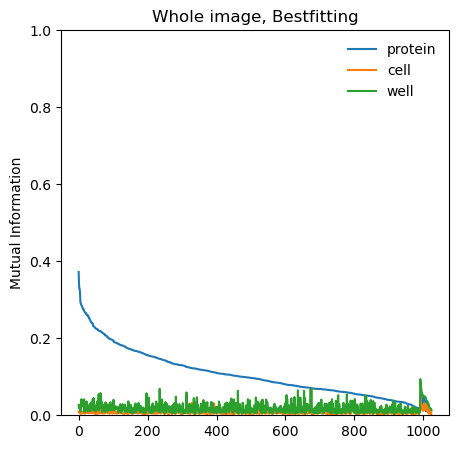

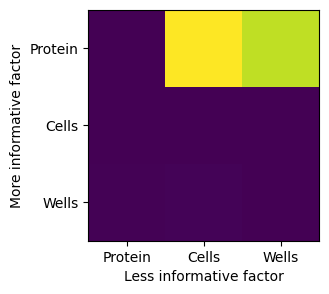

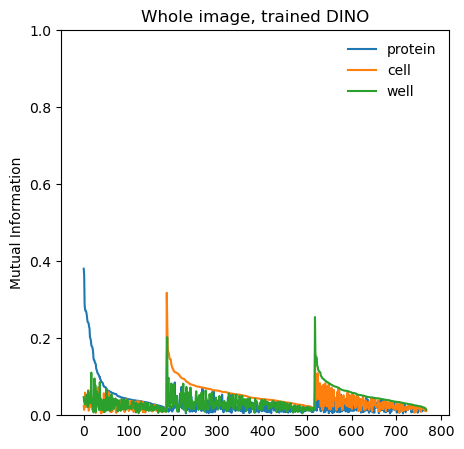

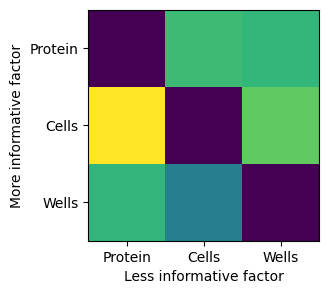

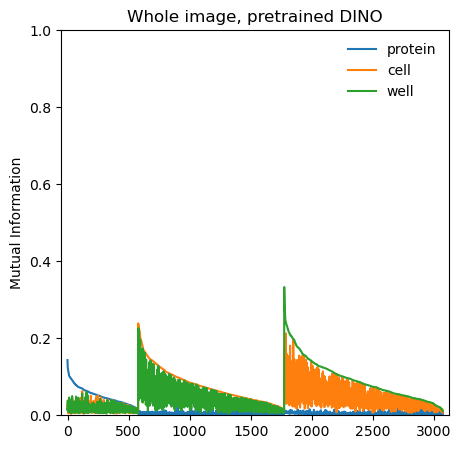

...

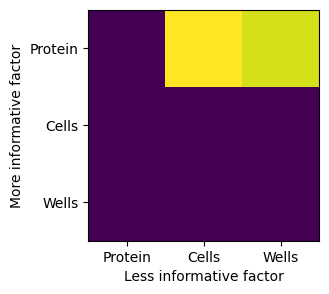

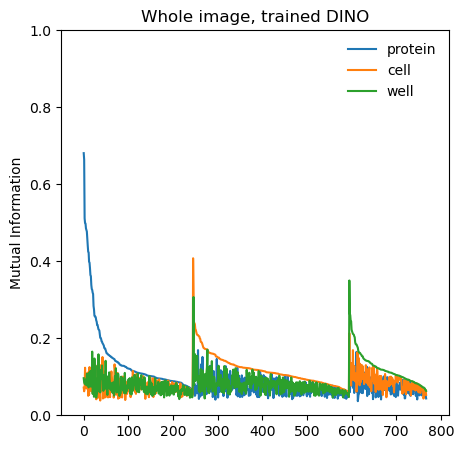

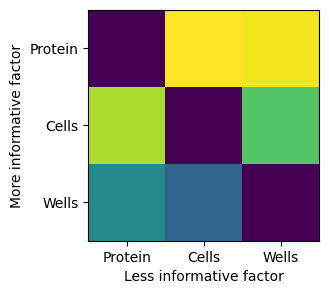

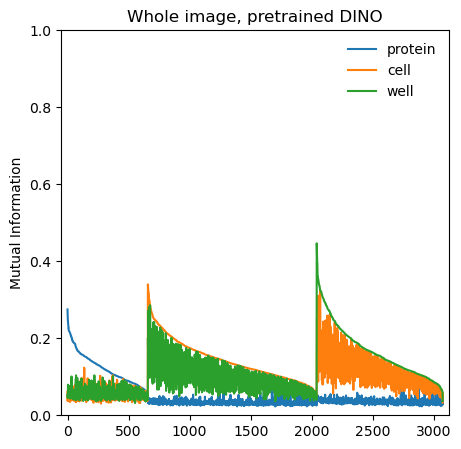

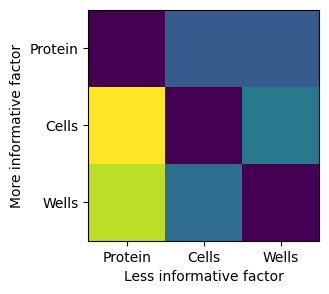

In [920]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
    'Whole image, Bestfitting',
    'Whole image, trained DINO',
    'Whole image, pretrained DINO',
             ]

label_types = [
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
    'full',
    'full',
    'full',
              ]

factor_gaps_per_method = []
mi_matrices = []
code_bins = [50, 100, 150]
factor_bins = [5, 10, 20]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)

        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]

        factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                        np.argmax(website_cell[one_protein_indices], axis=1),
                        website_df['well'].values[one_protein_indices].astype(int))).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, factor_bin)
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, factor_bin)
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, factor_bin)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
    #     dcimig_score, mi_matrix = dcimig(factors, codes)
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        mi_matrices.append(mi_matrix)

        whole_HPA_protein_MI = mi_matrix[0,:]
        whole_HPA_cell_MI = mi_matrix[1,:]
        whole_HPA_well_MI = mi_matrix[2,:]
        high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
        high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
        high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
        high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
        high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
        high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
        new_indices = np.concatenate((high_protein, high_cell, high_well))

        fig, axes = plt.subplots(1,1,figsize=(5,5))
        plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
        plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
        plt.plot(whole_HPA_well_MI[new_indices], label='well')
        plt.legend(frameon=False)
        plt.ylabel('Mutual Information')
        plt.title(label)
        plt.axis([-50,mi_matrix.shape[1] + 50, 0, 1])

        pairwise_disentanglement_matrix = [[(mi_matrix[dim_1, factor_indices[dim_1]] - mi_matrix[dim_2, factor_indices[dim_1]]).sum() for dim_2 in range(3)] for dim_1 in range(3)]
        fig, axes = plt.subplots(1,1,figsize=(3,3))
        plt.imshow(pairwise_disentanglement_matrix)
        print(pairwise_disentanglement_matrix)
        plt.xticks([0,1,2], ['Protein','Cells','Wells'])
        plt.yticks([0,1,2], ['Protein','Cells','Wells'])
        plt.ylabel('More informative factor')
        plt.xlabel('Less informative factor')


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [03:12<00:00,  5.32it/s]


[[0.0, 230.45857116290972, 218.46921366053664], [0.0, 0.0, 0.0], [0.030620098313909758, 0.05489643621900643, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [02:20<00:00,  5.47it/s]


[[0.0, 16.810001663210862, 18.328377031227454], [28.963896679587016, 0.0, 26.508902573844765], [5.682129448014566, 3.046751761943915, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [09:17<00:00,  5.51it/s]


[[0.0, 44.328204048281236, 48.53692661651396], [231.12154435952215, 0.0, 108.01762477616005], [107.05508601606425, 36.08444525115226, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [02:24<00:00,  5.33it/s]


[[0.0, 55.17732294021113, 56.9334898288882], [7.913116903886598, 0.0, 5.359695667059343], [1.428216621047868, 0.8432435744045409, 0.0]]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [02:59<00:00,  4.29it/s]


[[0.0, 7.052784627530121, 5.528037506508822], [6.352032288197494, 0.0, 3.3653457936485536], [25.88946164883579, 19.82709922416921, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1536/1536 [05:37<00:00,  4.55it/s]


[[0.0, 171.3930695274932, 164.80537596576255], [0.0, 0.0, 0.0], [0.017117818775619336, 0.04302914696236157, 0.0]]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [13:06<00:00,  3.90it/s]


[[0.0, 43.051104542655, 40.9457896835396], [59.657599924764725, 0.0, 28.215095782412913], [46.93267435177341, 21.99425316332702, 0.0]]


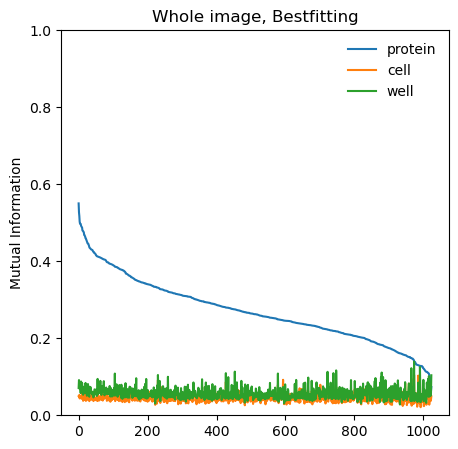

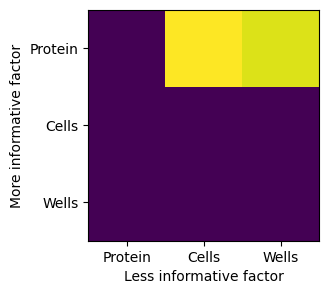

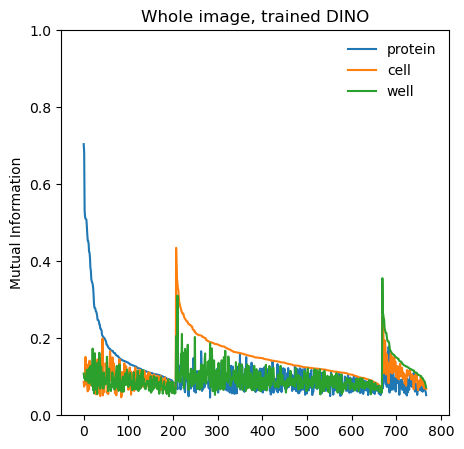

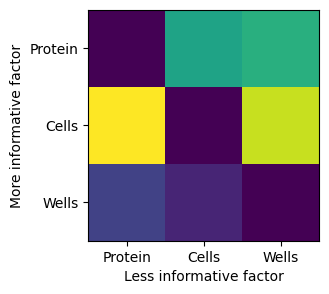

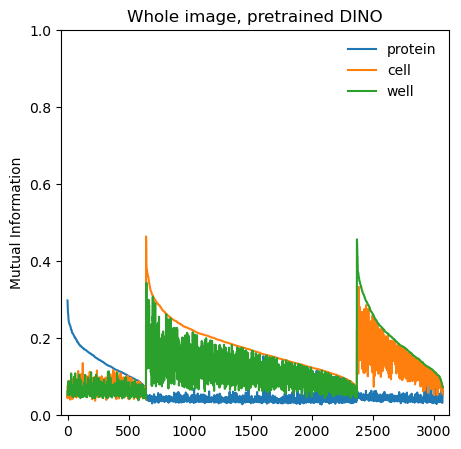

...

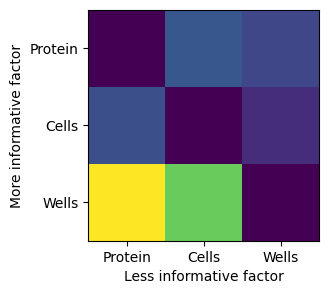

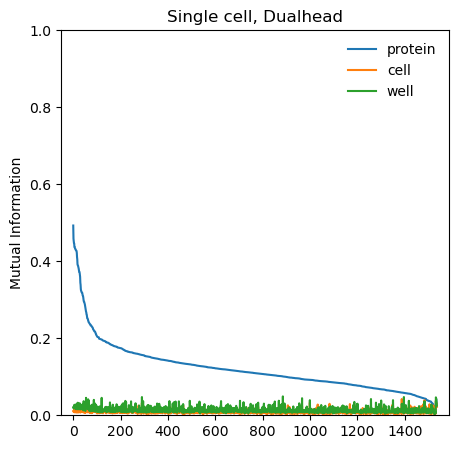

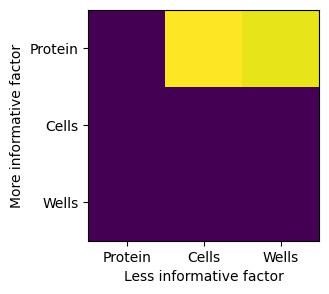

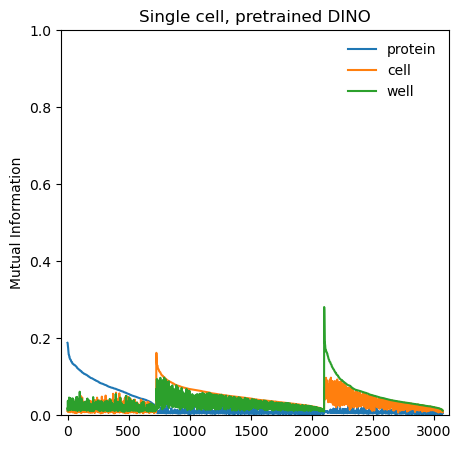

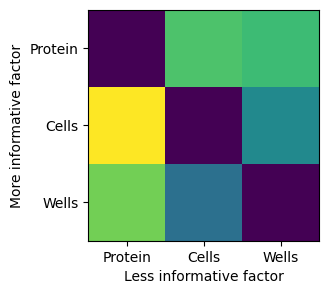

In [922]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_supervised_whole_image_model.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',    
    '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',    
               ]
labels = [
    'Whole image, Bestfitting',
    'Whole image, trained DINO',
    'Whole image, pretrained DINO',
    'Whole image, supervised ViT',
    'Single cell, trained DINO',
    'Single cell, Dualhead',
    'Single cell, pretrained DINO',    
             ]

label_types = [
    'whole_image',
    'whole_image',
    'whole_image',
    'whole_image',
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
    'full',
    'full',
    'full',
    'full',
    'full',
    'full',    
    'full',    
              ]

factor_gaps_per_method = []
mi_matrices = []
code_bins = [150]
factor_bins = [25]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)

        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]

        factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                        np.argmax(website_cell[one_protein_indices], axis=1),
                        website_df['well'].values[one_protein_indices].astype(int))).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, factor_bin)
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, factor_bin)
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, factor_bin)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
    #     dcimig_score, mi_matrix = dcimig(factors, codes)
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        mi_matrices.append(mi_matrix)

        whole_HPA_protein_MI = mi_matrix[0,:]
        whole_HPA_cell_MI = mi_matrix[1,:]
        whole_HPA_well_MI = mi_matrix[2,:]
        high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
        high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
        high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
        high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
        high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
        high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
        new_indices = np.concatenate((high_protein, high_cell, high_well))

        fig, axes = plt.subplots(1,1,figsize=(5,5))
        plt.plot(whole_HPA_protein_MI[new_indices], label='protein')
        plt.plot(whole_HPA_cell_MI[new_indices], label='cell')
        plt.plot(whole_HPA_well_MI[new_indices], label='well')
        plt.legend(frameon=False)
        plt.ylabel('Mutual Information')
        plt.title(label)
        plt.axis([-50,mi_matrix.shape[1] + 50, 0, 1])

        pairwise_disentanglement_matrix = [[(mi_matrix[dim_1, factor_indices[dim_1]] - mi_matrix[dim_2, factor_indices[dim_1]]).sum() for dim_2 in range(3)] for dim_1 in range(3)]
        fig, axes = plt.subplots(1,1,figsize=(3,3))
        plt.imshow(pairwise_disentanglement_matrix)
        print(pairwise_disentanglement_matrix)
        plt.xticks([0,1,2], ['Protein','Cells','Wells'])
        plt.yticks([0,1,2], ['Protein','Cells','Wells'])
        plt.ylabel('More informative factor')
        plt.xlabel('Less informative factor')


In [509]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_tta.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_hpa_single_cell_4_channels.yaml',    
    '/scr/mdoron/Dino4Cells/configs/config_pretrained.yaml',    
               ]
labels = [
    'Single cell, Dualhead',
    'Single cell, trained DINO',
    'Single cell, pretrained DINO',    
             ]

label_types = [
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
    'full',
    'full',    
    'full',    
              ]

factor_gaps_per_method = []
single_mi_matrices = []
code_bins = [25]
factor_bins = [25]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)

        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]

        factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                        np.argmax(website_cell[one_protein_indices], axis=1),
                        website_df['well'].values[one_protein_indices].astype(int))).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, factor_bin)
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, factor_bin)
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, factor_bin)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        single_mi_matrices.append(mi_matrix)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [02:32<00:00, 20.15it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 64.93it/s]


[[0.0, 0.0, 0.0], [0.5868782090184307, 0.0, 0.5293697344333852], [0.4367143307006439, 0.6330230623767881, 0.0]]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 768/768 [00:18<00:00, 40.71it/s]


[[0.0, 26.016420459669504, 11.1890703791772], [0.14562967278726963, 0.0, 0.11080216600388676], [3.252993284211599, 9.921149953273822, 0.0]]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [01:16<00:00, 40.18it/s]


[[0.0, 68.3390272794699, 32.83840423253934], [20.628829067534483, 0.0, 17.214411080757724], [7.589091227249106, 11.94823730265854, 0.0]]


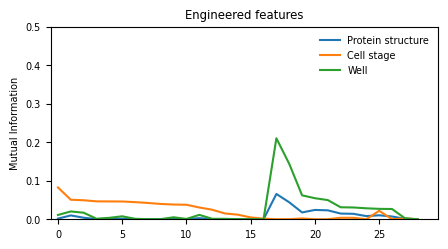

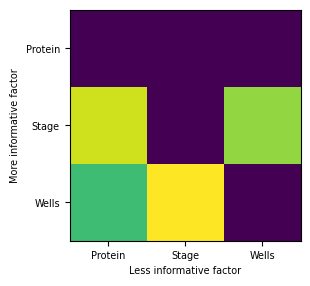

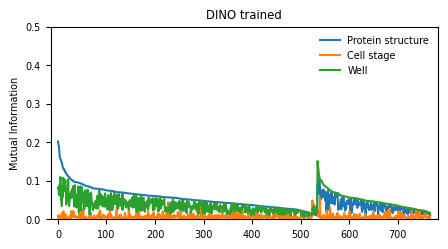

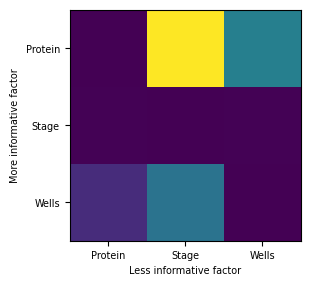

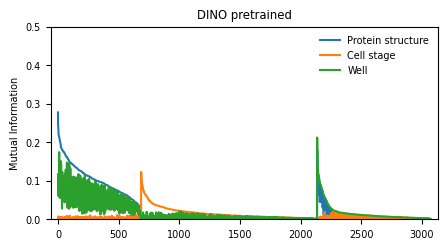

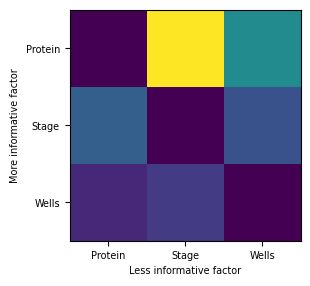

In [504]:
config_files = [
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_engineered.yaml',
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_3_channel.yaml',
    '/scr/mdoron/allen/cytodata-hackathon-base/Cytodata_DINO/config_pretrained_combined.yaml',
               ]
labels = [
    'Engineered features',
    'DINO trained',
    'DINO pretrained',
             ]

label_types = [
    'single_cells',
    'single_cells',
    'single_cells',
              ]

feature_types = [
    'full',
    'full',
    'full',
              ]

config = yaml.safe_load(open(config_files[0], "r"))
df = pd.read_csv(config['embedding']['df_path'])
try:
    features, _, IDs = torch.load(config['embedding']['output_path'])            
except:
    features, IDs = torch.load(config['embedding']['output_path'])            
      
factor_gaps_per_method = []
allen_mi_matrices = []
code_bins = [6]
factor_bins = [6]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        try:
            features, _, IDs = torch.load(config['embedding']['output_path'])            
        except:
            features, IDs = torch.load(config['embedding']['output_path'])            
#         pca = decomposition.PCA(n_components=100)
#         reduced_features = pca.fit_transform(features)
        reduced_features = features

        well_mat, well_labels = get_col_matrix(df, ['WellId'])    
        structure_mat, structure_labels = get_col_matrix(df, ['Structure'])    
        stage_mat, stage_labels = get_col_matrix(df, ['cell_stage'])    
        factors = np.stack((np.argmax(structure_mat, axis=1),
                        np.argmax(stage_mat, axis=1),
                        np.argmax(well_mat, axis=1))).T
        codes = torch.Tensor(reduced_features)

        allen_protein_MI = []
        allen_cell_MI = []
        allen_well_MI = []

        for i in tqdm(range(codes.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, factor_bin)
            allen_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, factor_bin)
            allen_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, factor_bin)
            allen_well_MI.append(well_mi)      
        mi_matrix = np.stack((allen_protein_MI, allen_cell_MI, allen_well_MI))
    #     dcimig_score, mi_matrix = dcimig(factors, codes)
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        allen_mi_matrices.append(mi_matrix)

        allen_protein_MI = mi_matrix[0,:]
        allen_cell_MI = mi_matrix[1,:]
        allen_well_MI = mi_matrix[2,:]
        high_protein = np.where((allen_protein_MI > allen_cell_MI) & (allen_protein_MI > allen_well_MI))[0]
        high_protein = high_protein[np.argsort(allen_protein_MI[high_protein])][::-1]
        high_cell = np.where((allen_cell_MI > allen_protein_MI) & (allen_cell_MI > allen_well_MI))[0]
        high_cell = high_cell[np.argsort(allen_cell_MI[high_cell])][::-1]
        high_well = np.where((allen_well_MI > allen_protein_MI) & (allen_well_MI > allen_cell_MI))[0]
        high_well = high_well[np.argsort(allen_well_MI[high_well])][::-1]
        new_indices = np.concatenate((high_protein, high_cell, high_well))

        fig, axes = plt.subplots(1,1,figsize=(5,2.5))
        plt.plot(allen_protein_MI[new_indices], label='Protein structure')
        plt.plot(allen_cell_MI[new_indices], label='Cell stage')
        plt.plot(allen_well_MI[new_indices], label='Well')
        plt.legend(frameon=False)
        plt.ylabel('Mutual Information')
        plt.title(label)
        plt.axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.5])


        pairwise_disentanglement_matrix = [[(mi_matrix[dim_1, factor_indices[dim_1]] - mi_matrix[dim_2, factor_indices[dim_1]]).sum() for dim_2 in range(3)] for dim_1 in range(3)]
        fig, axes = plt.subplots(1,1,figsize=(3,3))
        plt.imshow(pairwise_disentanglement_matrix)
        print(pairwise_disentanglement_matrix)
        plt.xticks([0,1,2], ['Protein','Stage','Wells'])
        plt.yticks([0,1,2], ['Protein','Stage','Wells'])
        plt.ylabel('More informative factor')
        plt.xlabel('Less informative factor')


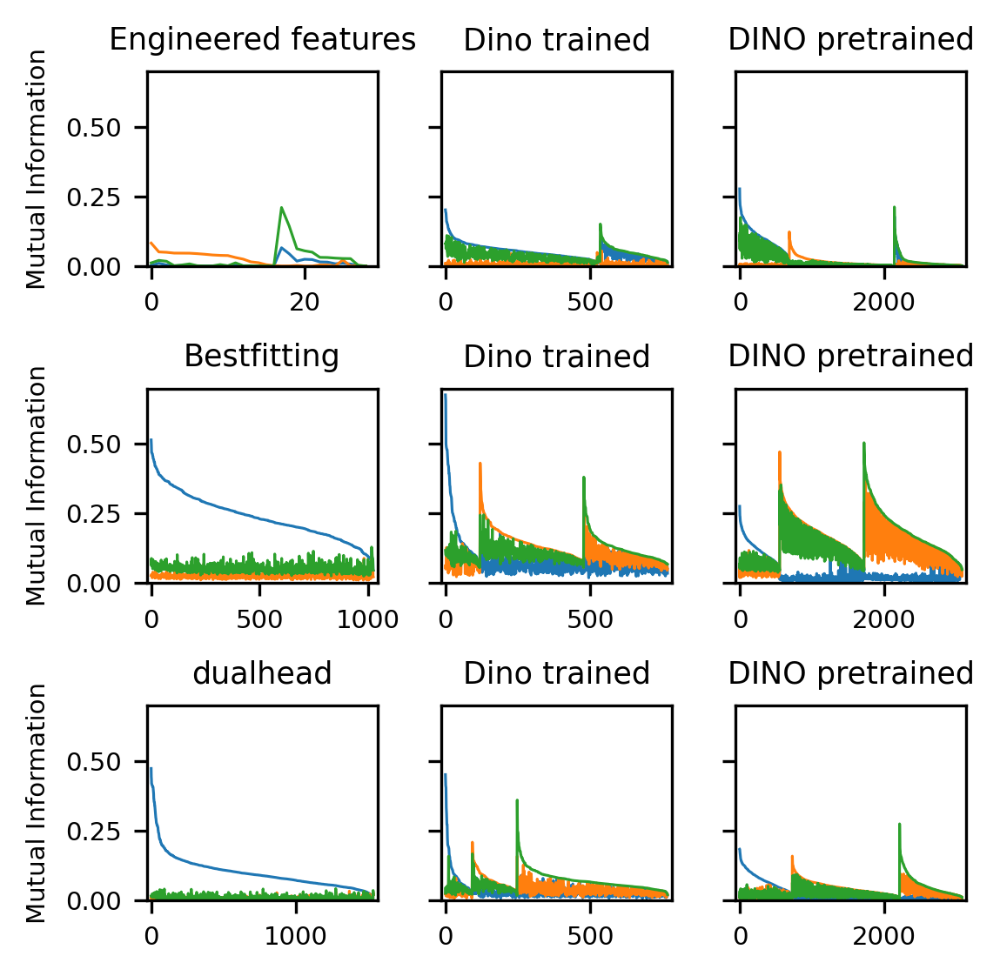

In [525]:
import matplotlib
font = {'size'   : 7}
matplotlib.rc('font', **font)

fig, axes = plt.subplots(3,3,figsize=(7.5 / 2,7.5 / 2), sharey=True, dpi=300)
lw = 0.75
allen_row_ind = 0
hpa_row_ind = 1
single_row_ind = 2
allen_model_labels = ['Engineered features', 'Dino trained', 'DINO pretrained']
allen_factor_labels = ['Protein structure', 'Cell stage', 'Well']

# fig = plt.figure(figsize=(7.5 / 2,7.5 / 2), dpi=300, constrained_layout=True)

for ind, (mi_matrix, label) in enumerate(zip(allen_mi_matrices, allen_model_labels)):
    allen_protein_MI = mi_matrix[0,:]
    allen_cell_MI = mi_matrix[1,:]
    allen_well_MI = mi_matrix[2,:]
    high_protein = np.where((allen_protein_MI > allen_cell_MI) & (allen_protein_MI > allen_well_MI))[0]
    high_protein = high_protein[np.argsort(allen_protein_MI[high_protein])][::-1]
    high_cell = np.where((allen_cell_MI > allen_protein_MI) & (allen_cell_MI > allen_well_MI))[0]
    high_cell = high_cell[np.argsort(allen_cell_MI[high_cell])][::-1]
    high_well = np.where((allen_well_MI > allen_protein_MI) & (allen_well_MI > allen_cell_MI))[0]
    high_well = high_well[np.argsort(allen_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes[allen_row_ind][ind].plot(allen_protein_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes[allen_row_ind][ind].plot(allen_cell_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes[allen_row_ind][ind].plot(allen_well_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes[allen_row_ind][0].set_ylabel('Mutual Information')
    axes[allen_row_ind][ind].set_title(label)
    axes[allen_row_ind][ind].axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.3])

for ind, (mi_matrix, label) in enumerate(zip(hpa_mi_matrices, hpa_model_labels)):
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes[hpa_row_ind][ind].plot(whole_HPA_protein_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes[hpa_row_ind][ind].plot(whole_HPA_cell_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes[hpa_row_ind][ind].plot(whole_HPA_well_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes[hpa_row_ind][0].set_ylabel('Mutual Information')
    axes[hpa_row_ind][ind].set_title(label)
    axes[hpa_row_ind][ind].axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.7])

for ind, (mi_matrix, label) in enumerate(zip(single_mi_matrices, single_model_labels)):
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes[single_row_ind][ind].plot(whole_HPA_protein_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes[single_row_ind][ind].plot(whole_HPA_cell_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes[single_row_ind][ind].plot(whole_HPA_well_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes[single_row_ind][0].set_ylabel('Mutual Information')
    axes[single_row_ind][ind].set_title(label)
    axes[single_row_ind][ind].axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.7])
    
plt.tight_layout()    


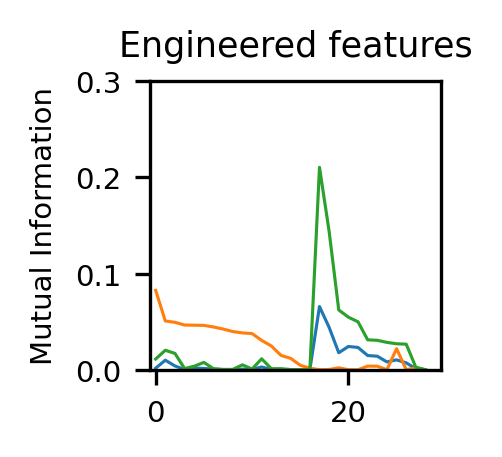

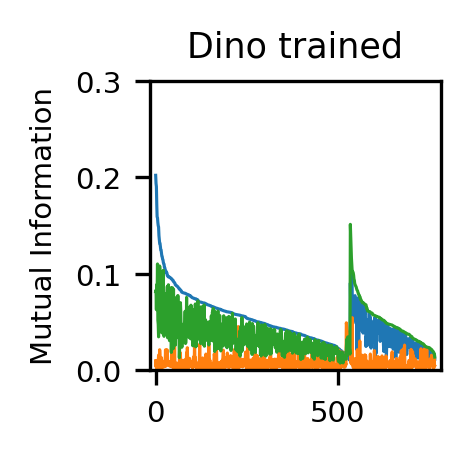

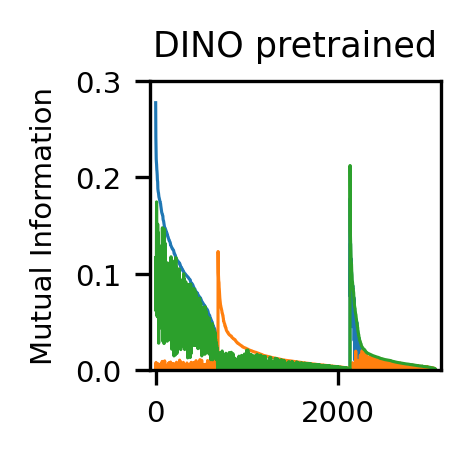

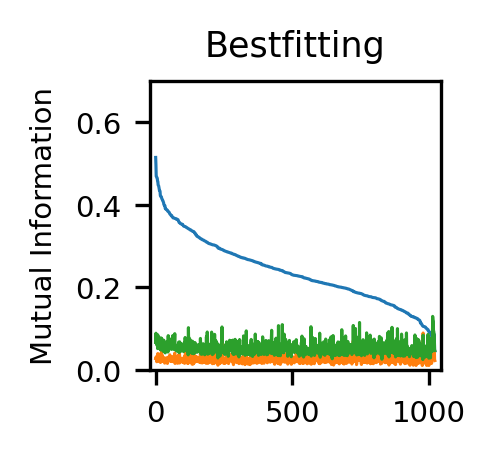

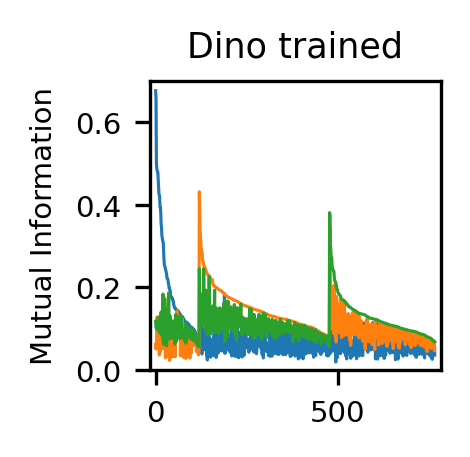

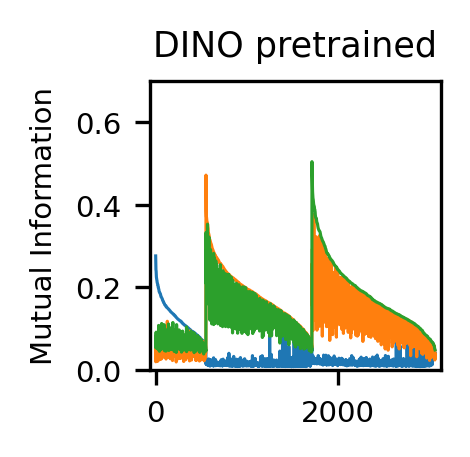

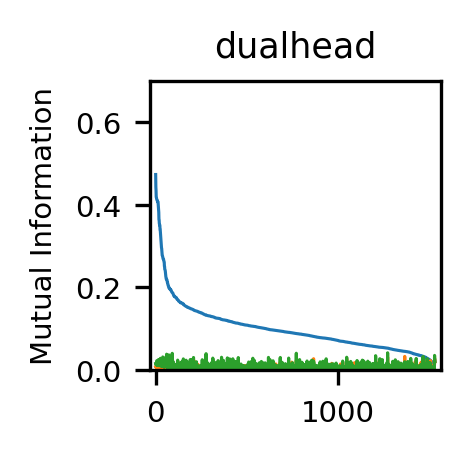

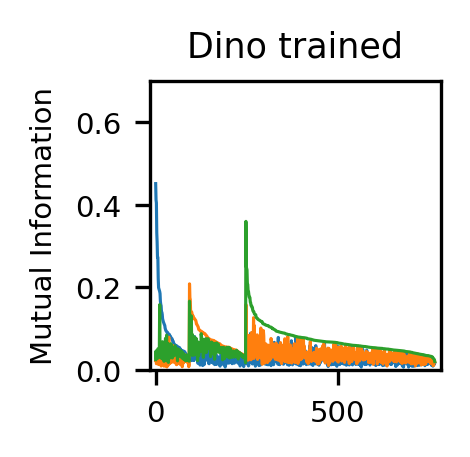

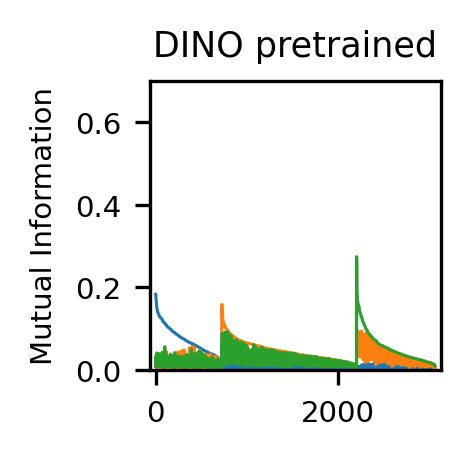

In [528]:
import matplotlib
font = {'size'   : 7}
matplotlib.rc('font', **font)

lw = 0.75
allen_row_ind = 0
hpa_row_ind = 1
single_row_ind = 2
allen_model_labels = ['Engineered features', 'Dino trained', 'DINO pretrained']
allen_factor_labels = ['Protein structure', 'Cell stage', 'Well']
hpa_model_labels = ['Bestfitting', 'Dino trained', 'DINO pretrained']
hpa_factor_labels = ['Protein localization', 'Cell type', 'Well']
single_model_labels = ['dualhead', 'Dino trained', 'DINO pretrained']
single_factor_labels = ['Protein localization', 'Cell type', 'Well']

# fig = plt.figure(figsize=(7.5 / 2,7.5 / 2), dpi=300, constrained_layout=True)

for ind, (mi_matrix, label) in enumerate(zip(allen_mi_matrices, allen_model_labels)):
    fig, axes = plt.subplots(1,1,figsize=(7.5 / 6,7.5 / 6), sharey=True, dpi=300)
    allen_protein_MI = mi_matrix[0,:]
    allen_cell_MI = mi_matrix[1,:]
    allen_well_MI = mi_matrix[2,:]
    high_protein = np.where((allen_protein_MI > allen_cell_MI) & (allen_protein_MI > allen_well_MI))[0]
    high_protein = high_protein[np.argsort(allen_protein_MI[high_protein])][::-1]
    high_cell = np.where((allen_cell_MI > allen_protein_MI) & (allen_cell_MI > allen_well_MI))[0]
    high_cell = high_cell[np.argsort(allen_cell_MI[high_cell])][::-1]
    high_well = np.where((allen_well_MI > allen_protein_MI) & (allen_well_MI > allen_cell_MI))[0]
    high_well = high_well[np.argsort(allen_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes.plot(allen_protein_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes.plot(allen_cell_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes.plot(allen_well_MI[new_indices], label=allen_factor_labels[ind], linewidth=lw)
    axes.set_ylabel('Mutual Information')
    axes.set_title(label)
    axes.axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.3])

for ind, (mi_matrix, label) in enumerate(zip(hpa_mi_matrices, hpa_model_labels)):
    fig, axes = plt.subplots(1,1,figsize=(7.5 / 6,7.5 / 6), sharey=True, dpi=300)
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes.plot(whole_HPA_protein_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes.plot(whole_HPA_cell_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes.plot(whole_HPA_well_MI[new_indices], label=hpa_factor_labels[ind], linewidth=lw)
    axes.set_ylabel('Mutual Information')
    axes.set_title(label)
    axes.axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.7])

for ind, (mi_matrix, label) in enumerate(zip(single_mi_matrices, single_model_labels)):
    fig, axes = plt.subplots(1,1,figsize=(7.5 / 6,7.5 / 6), sharey=True, dpi=300)
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))

    axes.plot(whole_HPA_protein_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes.plot(whole_HPA_cell_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes.plot(whole_HPA_well_MI[new_indices], label=single_factor_labels[ind], linewidth=lw)
    axes.set_ylabel('Mutual Information')
    axes.set_title(label)
    axes.axis([-mi_matrix.shape[1] / 50,mi_matrix.shape[1] + mi_matrix.shape[1] / 50, 0, 0.7])
    
# plt.tight_layout()    


array([1, 2])

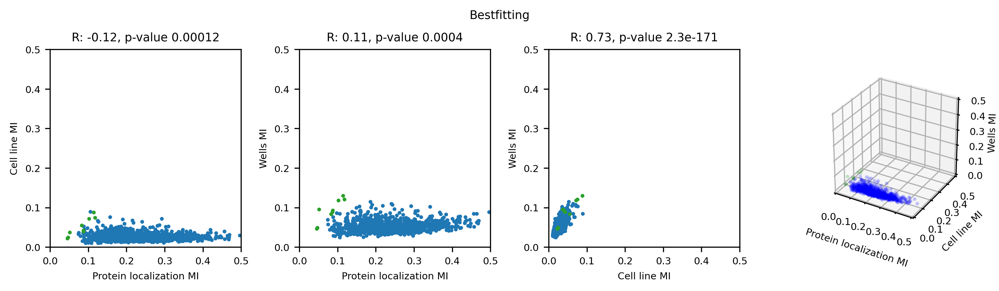

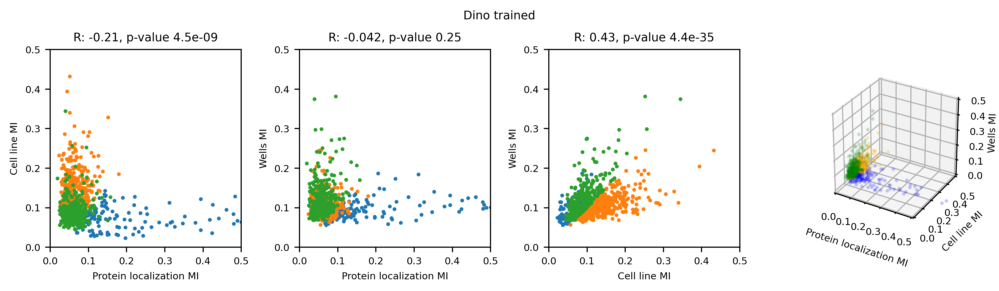

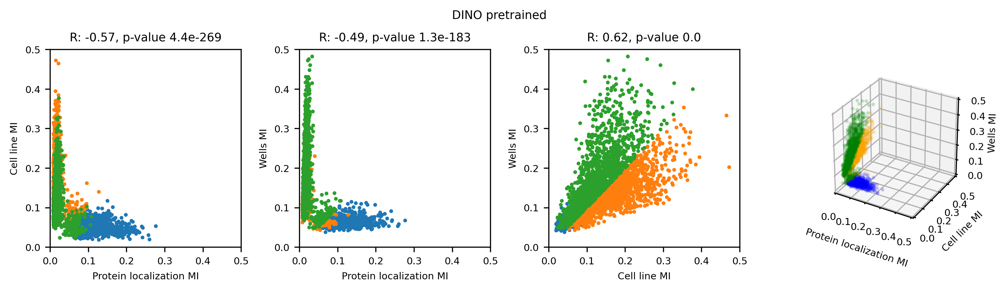

In [501]:
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(hpa_mi_matrices, hpa_model_labels)):
    fig = plt.figure(figsize=(2.5 * 4, 2.5 * 2), dpi=300)
    G = gridspec.GridSpec(2, 4)

    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    color_values = np.linspace(0.1, 0.9, 3)
    new_indices_colors = np.concatenate(([color_values[0]] * len(high_protein), [color_values[1]] * len(high_cell), [color_values[2]] * len(high_well)))

    mi_matrix = mi_matrix.T

    inner_indices = [[0,1],[0,2],[1,2]]
    labels = ['Protein localization MI', 'Cell line MI', 'Wells MI']

    for ind in range(3):
        ax = plt.subplot(G[0, ind])
        inner_ind_1, inner_ind_2 = inner_indices[ind]
        for indices in [high_protein, high_cell, high_well]:
            ax.scatter(mi_matrix[indices,inner_ind_1],
                        mi_matrix[indices,inner_ind_2],
                        s=3,
                        alpha=1)   
        ax.set_xlabel(labels[inner_ind_1])
        ax.set_ylabel(labels[inner_ind_2])
        ax.axis([0, 0.5, 0, 0.5])
        R, p = pearsonr(mi_matrix[:,inner_ind_1], mi_matrix[:,inner_ind_2])
        ax.set_title(f'R: {R:0.2}, p-value {p:0.2}')
    plt.tight_layout()

    new_indices_colors = np.concatenate((['blue'] * len(high_protein), ['orange'] * len(high_cell), ['green'] * len(high_well)))

    ax = plt.subplot(G[0, 3], projection='3d')
#     ax.set_box_aspect([2,1,1], zoom=5)
    ax.scatter(
                mi_matrix[new_indices,0], 
                 mi_matrix[new_indices,1], 
                 mi_matrix[new_indices,2],
                 c=new_indices_colors,
                 s=3,
                 alpha=0.15)
#     ax.set_aspect('equal')

    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])
    ax.zaxis.labelpad=0.1
    limits = np.array([getattr(ax, f'get_{axis}lim')() for axis in 'xyz'])
    ax.axes.set_xlim3d(left=0.0, right=0.5) 
    ax.axes.set_ylim3d(bottom=0.0, top=0.5) 
    ax.axes.set_zlim3d(bottom=0.0, top=0.5) 

    ax.set_box_aspect([1,1,1], zoom=0.8)
#     ax.set_box_aspect(aspect=None, zoom=0.8)
#     ax.set_box_aspect(aspect = (100,1,1))
    plt.suptitle(mi_label)
    plt.tight_layout()


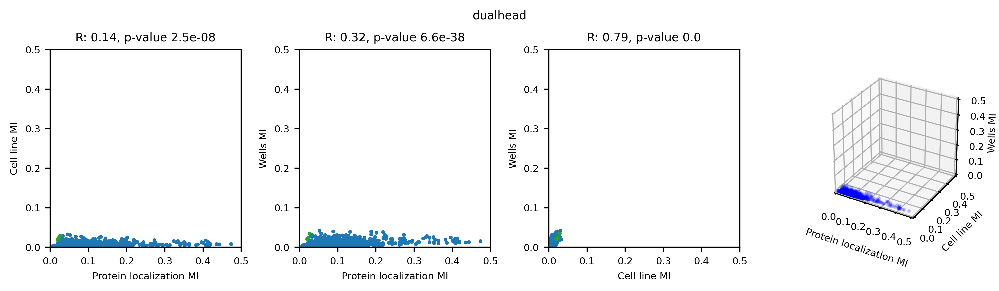

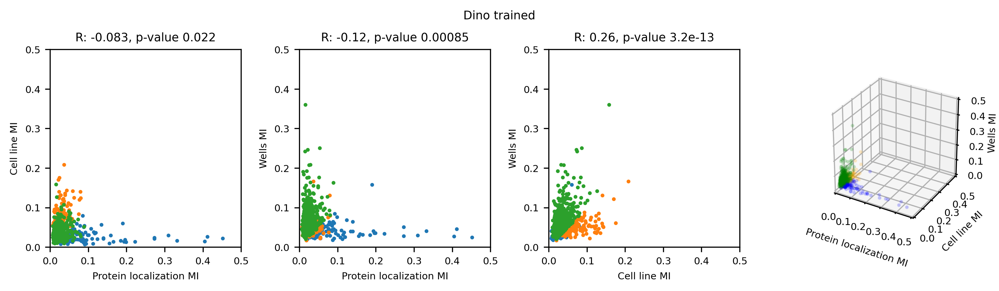

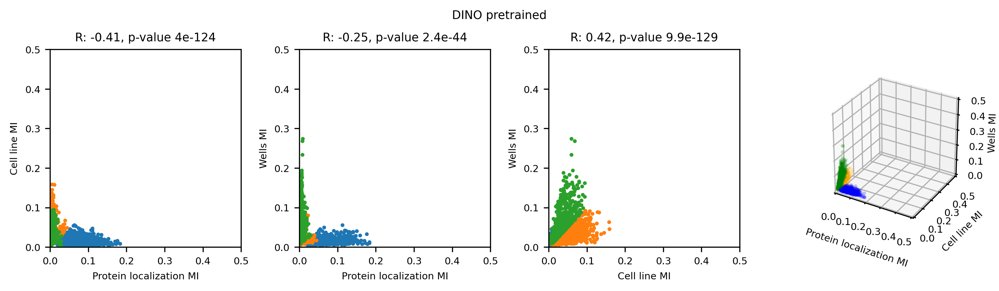

In [513]:
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(single_mi_matrices, single_model_labels)):
    fig = plt.figure(figsize=(2.5 * 4, 2.5 * 2), dpi=300)
    G = gridspec.GridSpec(2, 4)
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    color_values = np.linspace(0.1, 0.9, 3)
    new_indices_colors = np.concatenate(([color_values[0]] * len(high_protein), [color_values[1]] * len(high_cell), [color_values[2]] * len(high_well)))

    mi_matrix = mi_matrix.T

    inner_indices = [[0,1],[0,2],[1,2]]
    labels = ['Protein localization MI', 'Cell line MI', 'Wells MI']

    for ind in range(3):
        ax = plt.subplot(G[0, ind])
        inner_ind_1, inner_ind_2 = inner_indices[ind]
        for indices in [high_protein, high_cell, high_well]:
            ax.scatter(mi_matrix[indices,inner_ind_1],
                        mi_matrix[indices,inner_ind_2],
                        s=3,
                        alpha=1)   
        ax.set_xlabel(labels[inner_ind_1])
        ax.set_ylabel(labels[inner_ind_2])
        ax.axis([0, 0.5, 0, 0.5])
        R, p = pearsonr(mi_matrix[:,inner_ind_1], mi_matrix[:,inner_ind_2])
        ax.set_title(f'R: {R:0.2}, p-value {p:0.2}')
    plt.tight_layout()

    new_indices_colors = np.concatenate((['blue'] * len(high_protein), ['orange'] * len(high_cell), ['green'] * len(high_well)))

    ax = plt.subplot(G[0, 3], projection='3d')
#     ax.set_box_aspect([2,1,1], zoom=5)
    ax.scatter(
                mi_matrix[new_indices,0], 
                 mi_matrix[new_indices,1], 
                 mi_matrix[new_indices,2],
                 c=new_indices_colors,
                 s=3,
                 alpha=0.15)
#     ax.set_aspect('equal')

    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])
    ax.zaxis.labelpad=0.1
    limits = np.array([getattr(ax, f'get_{axis}lim')() for axis in 'xyz'])
    ax.axes.set_xlim3d(left=0.0, right=0.5) 
    ax.axes.set_ylim3d(bottom=0.0, top=0.5) 
    ax.axes.set_zlim3d(bottom=0.0, top=0.5) 

    ax.set_box_aspect([1,1,1], zoom=0.8)
#     ax.set_box_aspect(aspect=None, zoom=0.8)
#     ax.set_box_aspect(aspect = (100,1,1))
    plt.suptitle(mi_label)
    plt.tight_layout()


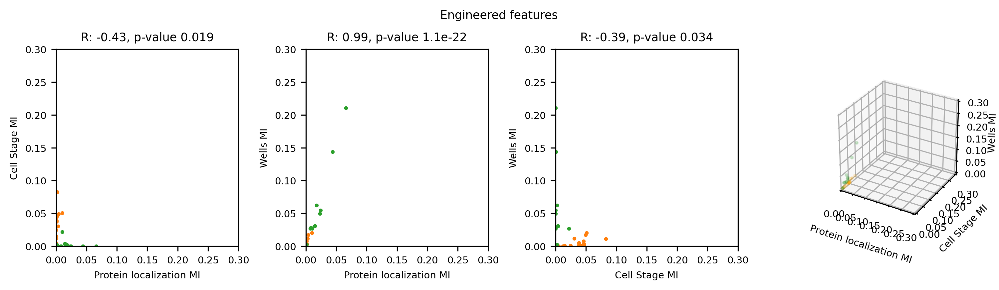

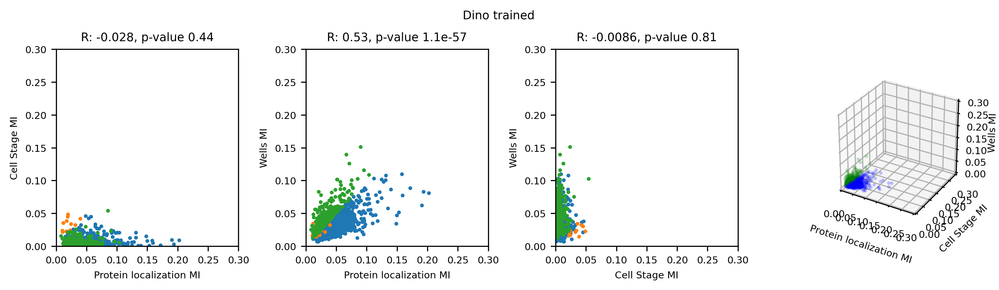

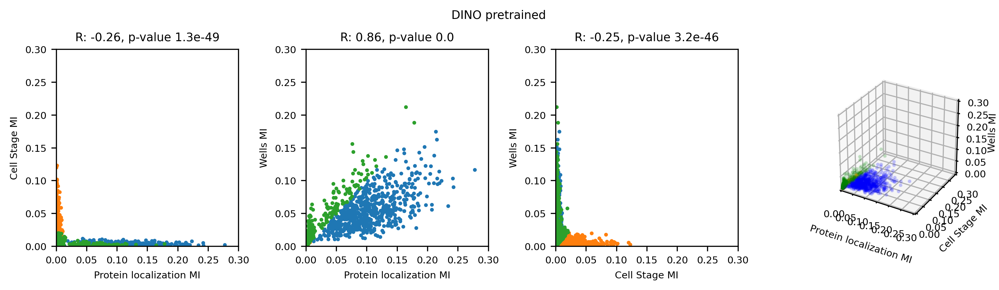

In [546]:
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(allen_mi_matrices, allen_model_labels)):
    fig = plt.figure(figsize=(2.5 * 4, 2.5 * 2), dpi=300)
    G = gridspec.GridSpec(2, 4)
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    color_values = np.linspace(0.1, 0.9, 3)
    new_indices_colors = np.concatenate(([color_values[0]] * len(high_protein), [color_values[1]] * len(high_cell), [color_values[2]] * len(high_well)))

    mi_matrix = mi_matrix.T

    inner_indices = [[0,1],[0,2],[1,2]]
    labels = ['Protein localization MI', 'Cell Stage MI', 'Wells MI']

    for ind in range(3):
        ax = plt.subplot(G[0, ind])
        inner_ind_1, inner_ind_2 = inner_indices[ind]
        for indices in [high_protein, high_cell, high_well]:
            ax.scatter(mi_matrix[indices,inner_ind_1],
                        mi_matrix[indices,inner_ind_2],
                        s=3,
                        alpha=1)   
        ax.set_xlabel(labels[inner_ind_1])
        ax.set_ylabel(labels[inner_ind_2])
        ax.axis([0, 0.3, 0, 0.3])
        R, p = pearsonr(mi_matrix[:,inner_ind_1], mi_matrix[:,inner_ind_2])
        ax.set_title(f'R: {R:0.2}, p-value {p:0.2}')
    plt.tight_layout()

    new_indices_colors = np.concatenate((['blue'] * len(high_protein), ['orange'] * len(high_cell), ['green'] * len(high_well)))

    ax = plt.subplot(G[0, 3], projection='3d')
#     ax.set_box_aspect([2,1,1], zoom=5)
    ax.scatter(
                mi_matrix[new_indices,0], 
                 mi_matrix[new_indices,1], 
                 mi_matrix[new_indices,2],
                 c=new_indices_colors,
                 s=3,
                 alpha=0.15)
#     ax.set_aspect('equal')

    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])
    ax.zaxis.labelpad=0.1
    limits = np.array([getattr(ax, f'get_{axis}lim')() for axis in 'xyz'])
    ax.axes.set_xlim3d(left=0.0, right=0.3) 
    ax.axes.set_ylim3d(bottom=0.0, top=0.3) 
    ax.axes.set_zlim3d(bottom=0.0, top=0.3) 

    ax.set_box_aspect([1,1,1], zoom=0.8)
#     ax.set_box_aspect(aspect=None, zoom=0.8)
#     ax.set_box_aspect(aspect = (100,1,1))
    plt.suptitle(mi_label)
    plt.tight_layout()


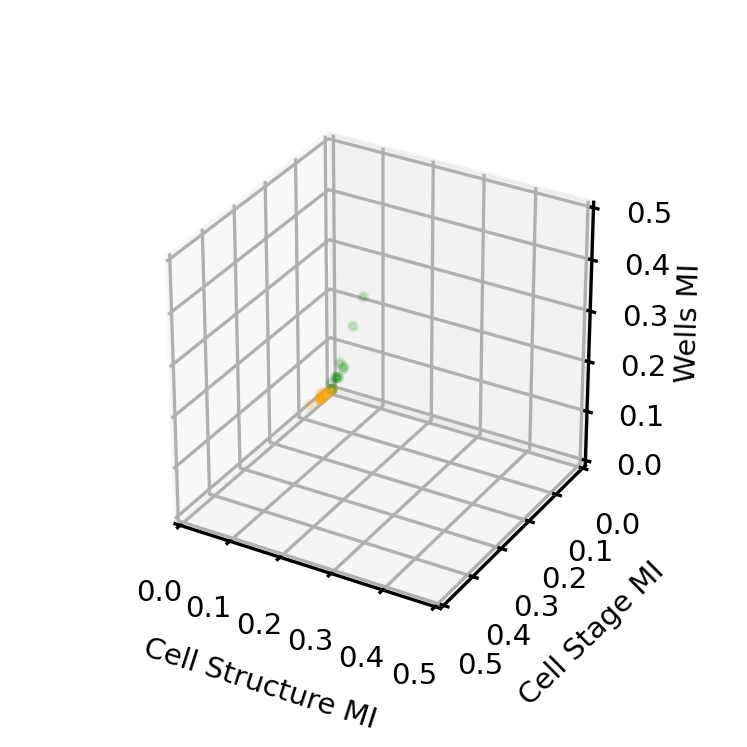

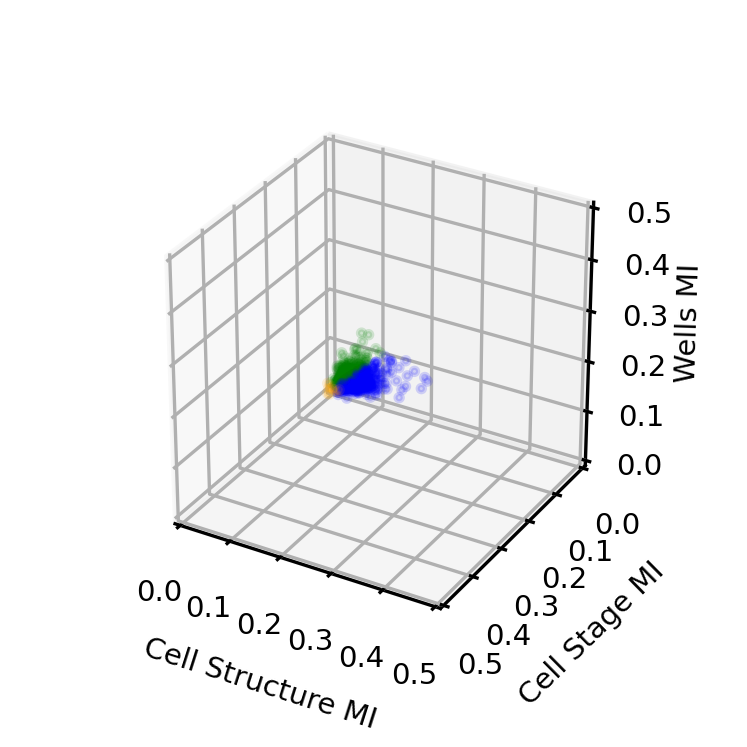

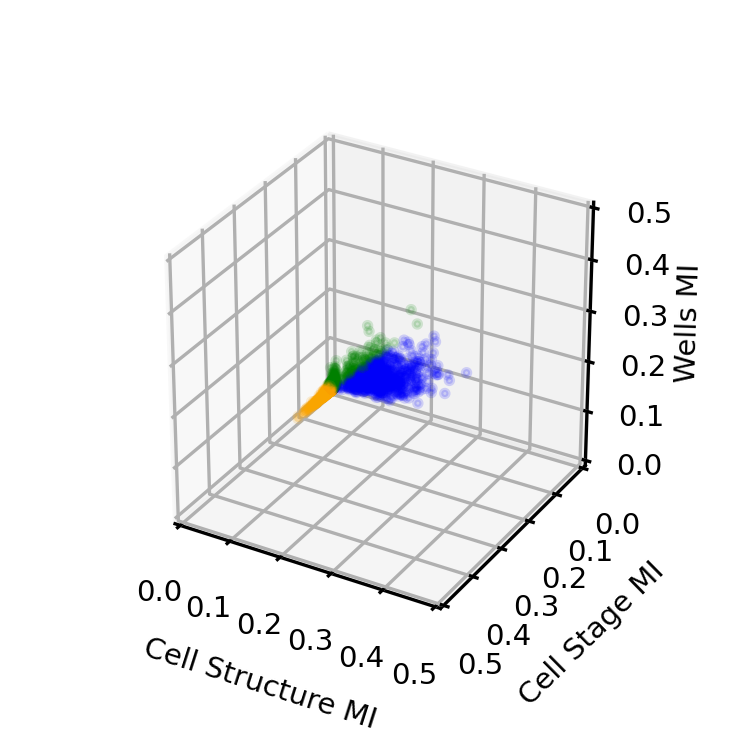

In [555]:
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
cmap = cm.nipy_spectral

for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(allen_mi_matrices, allen_model_labels)):
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    color_values = np.linspace(0.1, 0.9, 3)
    new_indices_colors = np.concatenate(([color_values[0]] * len(high_protein), 
                                         [color_values[1]] * len(high_cell), 
                                         [color_values[2]] * len(high_well)))
    new_indices_colors = np.concatenate((['blue'] * len(high_protein), ['orange'] * len(high_cell), ['green'] * len(high_well)))
    mi_matrix = mi_matrix.T
    labels = ['Cell Structure MI', 'Cell Stage MI', 'Wells MI']
    
    fig = plt.figure(figsize=(2.5 * 1, 2.5 * 1), dpi=300)
    G = gridspec.GridSpec(1, 1)
    ax = plt.subplot(G[0, 0], projection='3d')
#     ax.set_box_aspect([2,1,1], zoom=5)
    ax.scatter(
                mi_matrix[new_indices,0], 
                 mi_matrix[new_indices,1], 
                 mi_matrix[new_indices,2],
                 c=new_indices_colors,
                 s=3,
                 alpha=0.15)
#     ax.set_aspect('equal')

    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_zlabel(labels[2])
    ax.zaxis.labelpad=0.1
    limits = np.array([getattr(ax, f'get_{axis}lim')() for axis in 'xyz'])
    ax.axes.set_xlim3d(left=0.0, right=0.5) 
    ax.axes.set_ylim3d(bottom=0.0, top=0.5) 
    ax.axes.set_zlim3d(bottom=0.0, top=0.5) 
    ax.set_box_aspect([1,1,1], zoom=0.75)
    ax.invert_yaxis()
    
#     ax.set_box_aspect(aspect=None, zoom=0.8)
#     ax.set_box_aspect(aspect = (100,1,1))
#     plt.suptitle(mi_label)
    plt.tight_layout()


In [568]:
import matplotlib.gridspec as gridspec
from scipy.stats import pearsonr
cmap = cm.nipy_spectral

dominant_fov_percentages = []
for matrix_ind, (mi_matrix, mi_label) in enumerate(zip(single_mi_matrices, single_model_labels)):
    whole_HPA_protein_MI = mi_matrix[0,:]
    whole_HPA_cell_MI = mi_matrix[1,:]
    whole_HPA_well_MI = mi_matrix[2,:]
    high_protein = np.where((whole_HPA_protein_MI > whole_HPA_cell_MI) & (whole_HPA_protein_MI > whole_HPA_well_MI))[0]
    high_protein = high_protein[np.argsort(whole_HPA_protein_MI[high_protein])][::-1]
    high_cell = np.where((whole_HPA_cell_MI > whole_HPA_protein_MI) & (whole_HPA_cell_MI > whole_HPA_well_MI))[0]
    high_cell = high_cell[np.argsort(whole_HPA_cell_MI[high_cell])][::-1]
    high_well = np.where((whole_HPA_well_MI > whole_HPA_protein_MI) & (whole_HPA_well_MI > whole_HPA_cell_MI))[0]
    high_well = high_well[np.argsort(whole_HPA_well_MI[high_well])][::-1]
    new_indices = np.concatenate((high_protein, high_cell, high_well))
    dominant_fov_percentage = [len(high_protein) / len(new_indices),
                               len(high_cell) / len(new_indices),
                               len(high_well) / len(new_indices),]
    dominant_fov_percentages.append(dominant_fov_percentage)
                               
dominant_fov_percentages
plt.figure(figsize=(2.5,2.5))
plt.pie(dominant_fov_percentages[0])
plt.figure(figsize=(2.5,2.5))
plt.pie(dominant_fov_percentages[1])
plt.figure(figsize=(2.5,2.5))
plt.pie(dominant_fov_percentages[2])
        

([<matplotlib.patches.Wedge at 0x7f80205a3ac0>,
 [Text(0.8097372640044238, 0.7445304314013164, ''),
  Text(-1.0893782066981872, 0.1524963041225659, ''),
  Text(0.6987017688296148, -0.8495974565842154, '')])

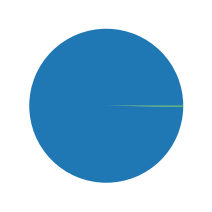

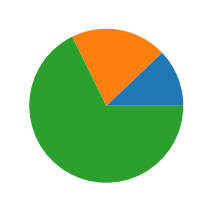

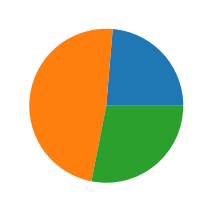

In [116]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]
labels = [
    'Whole image, Bestfitting',
    'Whole image, trained DINO',
    'Whole image, pretrained DINO',
             ]

label_types = [
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
    'full',
    'full',
    'full',
              ]

factor_gaps_per_method = []
hpa_mi_matrices = []
code_bins = [25]
factor_bins = [25]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)

        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]

        factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                        np.argmax(website_cell[one_protein_indices], axis=1),
                        website_df['well'].values[one_protein_indices].astype(int))).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, website_proteins.shape[1])
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, website_cell.shape[1])
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, 100)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
    #     dcimig_score, mi_matrix = dcimig(factors, codes)
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        hpa_mi_matrices.append(mi_matrix)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3072/3072 [01:55<00:00, 26.71it/s]


In [136]:
torch.load('LINCS_subset.pth').shape

torch.Size([93231, 768])

In [198]:
np.array(list(enumerate(groups.keys())))[np.argsort([len(a) for a in groups.values()])][::-1][:2]

array([['4', 'Other'],
       ['1', 'Control']], dtype='<U34')

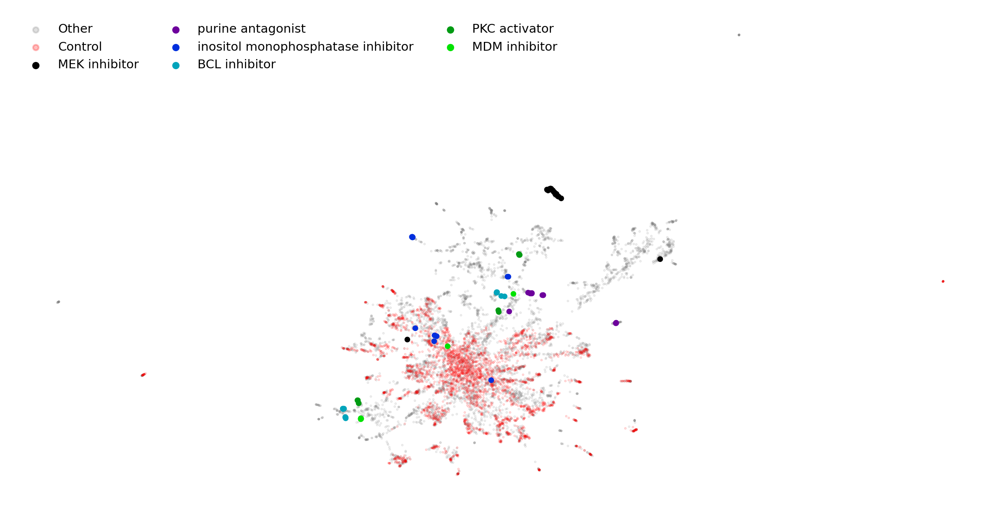

In [228]:
combined_df = pd.read_csv('UMAP_of_LINCS_ViT_Small_Compressed.csv')
values = combined_df[['X','Y']].values
groups = combined_df.groupby('highlight_moa').groups
fig, ax = plt.subplots(figsize=(10,5), facecolor='white', dpi=300)
scatter_ind = 0
for group_ind, group_key in np.array(list(enumerate(groups.keys())))[np.argsort([len(a) for a in groups.values()])][::-1][:2]:
    indices = groups[group_key]
    plt.scatter(values[indices, 0],
                values[indices, 1],
                s = 0.1,
                label=group_key,
                color=['grey','red'][int(scatter_ind)],
               alpha=0.25)
    plt.axis('off')
    scatter_ind += 1

scatter_ind = 0
for group_ind, group_key in np.array(list(enumerate(groups.keys())))[np.argsort([len(a) for a in groups.values()])][::-1][2:]:
    indices = groups[group_key]
    plt.scatter(values[indices, 0],
                values[indices, 1],
                s = 5,
                label=group_key,
                color=cmap((int(scatter_ind)) / (len(groups) + 1)))
    plt.axis('off')    
    scatter_ind += 1
lgnd = plt.legend(frameon=False, ncols=3)
for h in lgnd.legendHandles:
    h._sizes = [10]

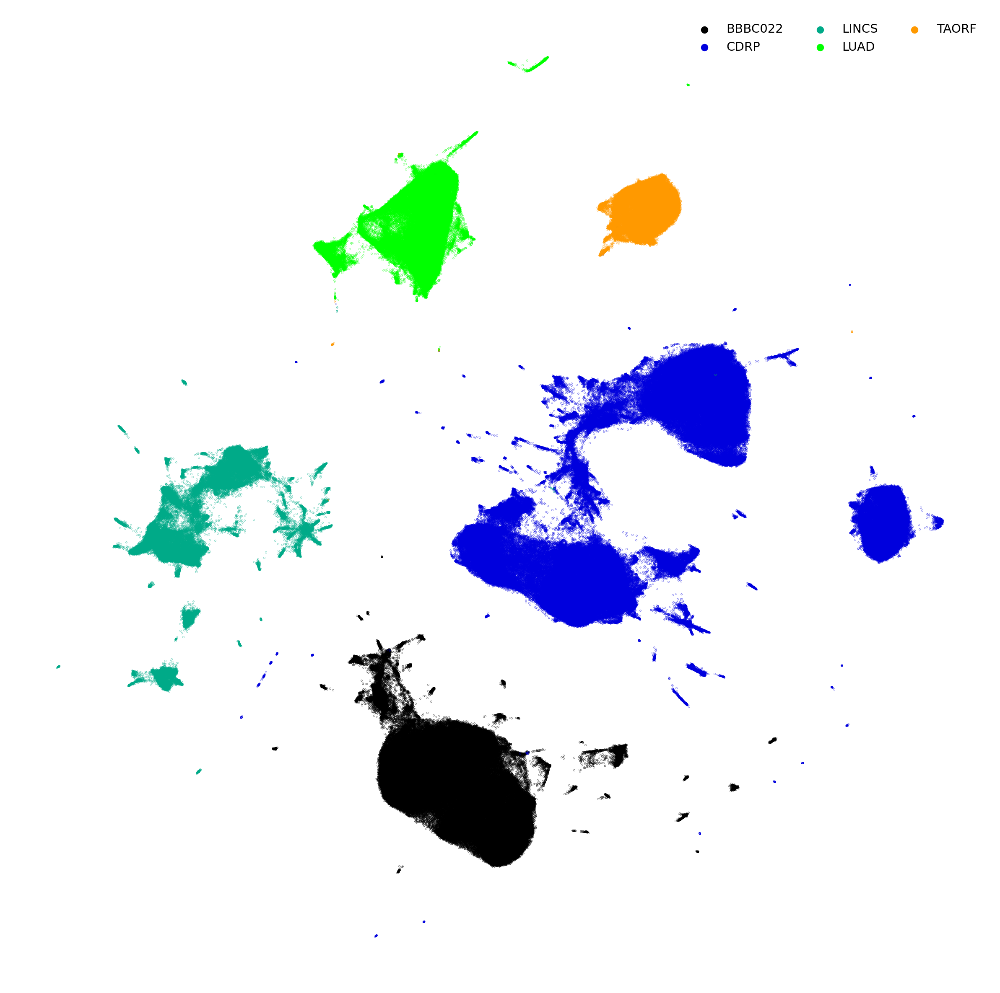

In [230]:
combined_df = pd.read_csv('UMAP_of_Combined_CP.csv')
values = combined_df[['X','Y']].values
groups = combined_df.groupby('Collection').groups
fig, ax = plt.subplots(figsize=(10,10), facecolor='white', dpi=300)
for group_ind, group_key in enumerate(groups.keys()):
    indices = groups[group_key]
    plt.scatter(values[indices, 0],
                values[indices, 1],
                s = 0.01,
                label=group_key,
                color=cmap(group_ind / len(groups)))
    plt.axis('off')
lgnd = plt.legend(frameon=False, ncols=3)
for h in lgnd.legendHandles:
    h._sizes = [10]    

In [8]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_bestfitting_whole.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
    '/scr/mdoron/Dino4Cells/configs/config_pretrained_whole_combined.yaml',
               ]

labels = [
    'Whole image, Bestfitting',
    'Whole image, trained DINO',
    'Whole image, pretrained DINO',
             ]

label_types = [
    'whole_image',
    'whole_image',
    'whole_image',
              ]

feature_types = [
    'full',
    'full',
    'full',
              ]

factor_gaps_per_method = []
hpa_mi_matrices = []
code_bins = [25]
factor_bins = [25]
for code_bin, factor_bin in zip(code_bins, factor_bins):
    for config_file, label in zip(config_files, labels):
        config = yaml.safe_load(open(config_file, "r"))
        df = pd.read_csv(config['embedding']['df_path'])
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        try:
            protein_localizations = torch.stack(protein_localizations)
        except:
            pass
        protein_localizations = torch.Tensor(protein_localizations)

        one_protein_indices = np.where(protein_localizations.sum(axis=1) == 1)[0]
        website_indices = np.where(df.ID.str.contains('_'))[0]
        website_features = features[website_indices,:]
        website_df = df.iloc[website_indices].reset_index()
        website_df['plate'] = website_df.ID.str.split('_', expand=True)[0].values
        website_df['well'] = website_df.ID.str.split('_', expand=True)[1].values
        website_proteins = protein_localizations[website_indices]
        cell_mat, cell_labels = get_col_matrix(df, ['cell_type'])    
        website_cell = cell_mat[website_indices]
        one_protein_indices = np.where(website_proteins.sum(axis=1) == 1)[0]
        website_features -= website_features.min(axis=0)[0]
        website_features /= website_features.max(axis=0)[0]

        factors = np.stack((np.argmax(website_proteins[one_protein_indices], axis=1).numpy(),
                        np.argmax(website_cell[one_protein_indices], axis=1),
                        website_df['well'].values[one_protein_indices].astype(int))).T
        codes = website_features[one_protein_indices]

        whole_HPA_protein_MI = []
        whole_HPA_cell_MI = []
        whole_HPA_well_MI = []

        for i in tqdm(range(website_features.shape[1])):
            protein_mi = mutual_info(codes[:,i].numpy(), factors[:,0], code_bin, website_proteins.shape[1])
            whole_HPA_protein_MI.append(protein_mi)
            cell_mi = mutual_info(codes[:,i].numpy(), factors[:,1], code_bin, website_cell.shape[1])
            whole_HPA_cell_MI.append(cell_mi)    
            well_mi = mutual_info(codes[:,i].numpy(), factors[:,2], code_bin, 100)
            whole_HPA_well_MI.append(well_mi)      
        mi_matrix = np.stack((whole_HPA_protein_MI, whole_HPA_cell_MI, whole_HPA_well_MI))
    #     dcimig_score, mi_matrix = dcimig(factors, codes)
        highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][0,:], range(mi_matrix.shape[1])))).T
        second_highest_factor_mask = np.array(list(zip(np.argsort(mi_matrix, axis=0)[::-1][1,:], range(mi_matrix.shape[1])))).T
        gap = mi_matrix[highest_factor_mask[0,:],:].diagonal() - mi_matrix[second_highest_factor_mask[0,:],:].diagonal()
        factor_indices = [np.where(mi_matrix[i,:] >= np.max(mi_matrix, axis=0))[0] for i in range(factors.shape[1])]
        factor_gaps = [gap[f].max() if len(f) > 0 else 0 for f in factor_indices]
        factor_gaps_per_method.append(factor_gaps)
        hpa_mi_matrices.append(mi_matrix)


In [231]:
mutual_info_regression(factors, codes[:,0], discrete_features=True, n_neighbors=3)

array([0.07051656, 0.31778685, 0.80108777])

In [43]:
def partial_mutual_info_regression(y):
    return mutual_info_regression(X=factors, discrete_features=True, y=y)


Text(0.5, 0, 'MAP')

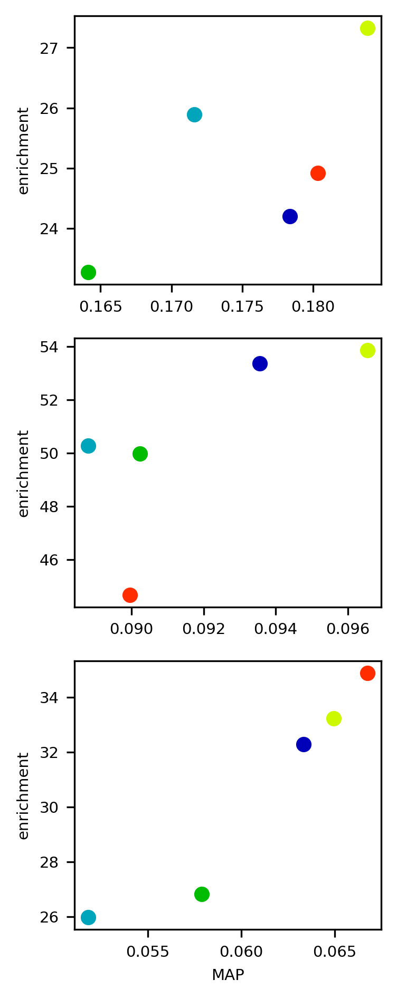

In [264]:


TAORF_ViT_Base_300_enrichment = 24.2
TAORF_ViT_Base_300_MAP = 0.1783741585
TAORF_CellProfiler_enrichment = 25.89
TAORF_CellProfiler_MAP = 0.1715952782
TAORF_ImageNet_enrichment = 23.27
TAORF_ImageNet_MAP = 0.164134703
TAORF_CNN_enrichment = 27.33
TAORF_CNN_MAP = 0.18382
TAORF_enrichment = 24.92
TAORF_MAP = 0.18033

BBBC022_ViT_Base_300_enrichment = 53.37
BBBC022_ViT_Base_300_MAP = 0.09356398887
BBBC022_CellProfiler_enrichment = 50.27
BBBC022_CellProfiler_MAP = 0.088801
BBBC022_ImageNet_enrichment = 49.97
BBBC022_ImageNet_MAP = 0.09023
BBBC022_CNN_enrichment = 53.85
BBBC022_CNN_MAP = 0.096541
BBBC022_enrichment = 44.68
BBBC022_MAP = 0.08996

CDRP_ViT_Base_300_enrichment = 32.29
CDRP_ViT_Base_300_MAP = 0.06333469423
CDRP_CellProfiler_enrichment = 25.98
CDRP_CellProfiler_MAP = 0.051813
CDRP_ImageNet_enrichment = 26.83
CDRP_ImageNet_MAP = 0.057885
CDRP_CNN_enrichment = 33.22
CDRP_CNN_MAP = 0.064951
CDRP_enrichment = 34.88
CDRP_MAP = 0.066742


fig, axes = plt.subplots(3, 1, figsize=(2.5,2.5 * 3), dpi=300)
axes[0].scatter(TAORF_ViT_Base_300_MAP, 
                TAORF_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[0].scatter(TAORF_CellProfiler_MAP, 
                TAORF_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[0].scatter(TAORF_ImageNet_MAP, 
                TAORF_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[0].scatter(TAORF_CNN_MAP, 
                TAORF_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[0].scatter(TAORF_MAP, 
                TAORF_enrichment, label='TAORF', color=cmap(5 / 6))
axes[0].set_ylabel('enrichment')
# axes[0].set_xlabel('MAP')
# axes[0].legend(frameon=False)

axes[1].scatter(BBBC022_ViT_Base_300_MAP, 
                BBBC022_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[1].scatter(BBBC022_CellProfiler_MAP, 
                BBBC022_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[1].scatter(BBBC022_ImageNet_MAP, 
                BBBC022_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[1].scatter(BBBC022_CNN_MAP, 
                BBBC022_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[1].scatter(BBBC022_MAP, 
                BBBC022_enrichment, label='BBBC022', color=cmap(5 / 6))
axes[1].set_ylabel('enrichment')
# axes[1].set_xlabel('MAP')
# axes[1].legend(frameon=False)

axes[2].scatter(CDRP_ViT_Base_300_MAP, 
                CDRP_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[2].scatter(CDRP_CellProfiler_MAP, 
                CDRP_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[2].scatter(CDRP_ImageNet_MAP, 
                CDRP_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[2].scatter(CDRP_CNN_MAP, 
                CDRP_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[2].scatter(CDRP_MAP, 
                CDRP_enrichment, label='CDRP', color=cmap(5 / 6))
axes[2].set_ylabel('enrichment')
axes[2].set_xlabel('MAP')
# axes[2].legend(frameon=False)
